# House sales prices in King County

A project on exploratory data analysis.

Sebastian Thomas @ neue fische Bootcamp Data Science<br />
(datascience at sebastianthomas dot de)

# Part 4: Exploratory data analysis

We explore the preprocessed data.

## Imports

### Modules, classes and functions

In [1]:
# data
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import seaborn as sns

# custom modules
from modules.ds import data_type_info, whiskers

We set the options to print all columns and to print float columns with two decimals.

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', '{:,.2f}'.format)

### Helpers

Some helping functions for exploration.

In [3]:
def print_unique_values(feature):
    '''Prints the unique values of feature of the houses data set.'''
    print(np.sort(houses_train[feature].unique()))

def print_number_of_unique_values(feature):
    '''Prints the number of unique values of feature of the houses data set.'''
    print(houses_train[feature].nunique())

def plot_hist(feature):
    '''Plots a histogram of feature.'''
    plt.figure(figsize=(20, 5), dpi=300)
    sns.distplot(houses_train[feature], kde=False)
    plt.show()

def plot_box(feature='price', group_by=None, restricted=False):
    '''Plots a boxplot of feature.'''
    plt.figure(figsize=(20, houses_train[group_by].unique().size*2.5 if group_by is not None else 5),
               dpi=300)
    ax = sns.boxplot(x=feature, y=group_by, data=houses_train, orient='h')
    if restricted:
        ax.set_xlim(whiskers(houses_train[feature]))
    plt.show()
    
def plot_dist(feature, restricted=False, vertical=False):
    '''Plots distribution of feature as boxplot and histogram.'''
    fig, ax = plt.subplots(2, 1, sharex=True, figsize=(20, 10), dpi=300)
    sns.boxplot(houses_train[feature], ax=ax[0])
    sns.distplot(houses_train[feature], kde=False)
    ax[0].get_xaxis().set_visible(False)
    if restricted:
        ax[1].set_xlim(whiskers(houses_train[feature]))
    if vertical:
        ax[1].set_xticklabels(ax.get_xticklabels(), rotation=90)
    plt.show()

def plot_count(feature, ordered=False, vertical=False):
    '''Plots a countplot of feature.'''
    plt.figure(figsize=(20, 5), dpi=300)
    order = houses_train.groupby(feature)[feature].count().sort_values().index if ordered else None
    ax = sns.countplot(x=feature, data=houses_train, order=order)
    if vertical:
        ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    plt.show()

def plot_scatter(feature, target='price'):
    '''Plots a scatter plot of feature against \'price\'.'''
    plt.figure(figsize=(20, 5), dpi=300)
    sns.scatterplot(x=feature, y=target, data=houses_train)
    plt.show()

def plot_bar_medians(feature='price', group_by=None, ordered=False, vertical=False):
    '''Plots median(s) as bar plot.'''
    plt.figure(figsize=(20, 5), dpi=300)
    order = houses_train.groupby(group_by)[feature].median().sort_values().index if ordered else None
    ax = sns.barplot(x=group_by, y=feature, data=houses_train, order=order, estimator=np.median)
    if vertical:
        ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    plt.show()

def plot_bar_log_medians(feature='price', group_by=None, ordered=False, vertical=False):
    '''Plots median(s) as bar plot.'''
    plt.figure(figsize=(20, 5), dpi=300)
    order = houses_train.groupby(group_by)[feature].median().sort_values().index if ordered else None
    ax = sns.barplot(x=group_by, y=feature, data=houses_train, order=order,
                     estimator=(lambda x: np.log(np.median(x))))
    if vertical:
        ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    plt.show()

### Data

We import the cleaned data with engineered features.

In [4]:
houses_train = pd.read_pickle('data/king_county_train_3.pickle')
features = pd.read_pickle('data/features_3.pickle')
houses_train.sample(5, random_state=0)

,price,date,month,sqft_living,sqft_above,sqft_basement,has_basement,room_size,base_area,sqft_lot,sqft_living15,sqft_lot15,bedrooms,bedrooms bin,bathrooms,bathrooms bin,bathrooms_ratio,bathrooms_ratio bin,floors,floors bin,yr_built,decade_built,yr_built bin,yr_renovated,is_renovated,lat,long,zipcode,zipcode cat,condition,condition bin,grade,grade bin,view,view bin,waterfront
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
8724300010,"548,000.00",2014-09-09,2014-09,"3,420.00","2,330.00","1,090.00",True,414.55,"1,710.00","5,012.00","2,320.00","5,465.00",4,4,3.25,3.25 to 3.5,0.81,0.795 to 1.160,2.00,1.5 to 2.0,2008,2000s,2002 to 2012,2008,True,47.73,-121.98,98019,2,3,3 to 4,10,10,0,0,False
1423400005,"249,950.00",2014-08-15,2014-08,"1,370.00","1,370.00",0.00,False,274.00,"1,370.00","11,658.00","1,080.00","9,198.00",3,3,1.00,0.75 to 1,0.33,0.000 to 0.345,1.00,1.0,1958,1950s,1932 to 1971,1958,False,47.46,-122.18,98058,1,4,3 to 4,6,3 to 6,0,0,False
7202330280,"401,000.00",2014-09-22,2014-09,"1,350.00","1,350.00",0.00,False,216.00,675.00,"2,839.00","1,650.00","3,093.00",3,3,2.25,2.25 to 3,0.75,0.615 to 0.795,2.00,1.5 to 2.0,2003,2000s,2002 to 2012,2003,True,47.68,-122.04,98053,4,3,3 to 4,7,7,0,0,False
1828000230,"498,000.00",2014-07-14,2014-07,"1,620.00","1,180.00",440.00,True,270.00,"1,620.00","8,400.00","2,120.00","8,424.00",3,3,2.00,1.25 to 2,0.67,0.615 to 0.795,1.00,1.0,1968,1960s,1932 to 1971,1968,False,47.66,-122.13,98052,4,3,3 to 4,7,7,0,0,False
3342100995,"449,000.00",2014-10-22,2014-10,"1,980.00","1,980.00",0.00,False,264.00,990.00,"5,400.00","1,980.00","5,400.00",4,4,2.50,2.25 to 3,0.62,0.615 to 0.795,2.00,1.5 to 2.0,1998,1990s,1992 to 2001,1998,True,47.52,-122.21,98056,1,3,3 to 4,8,8,0,0,False


## Overview

In [5]:
data_type_info(houses_train)

,dtype,n_unique,p_unique,n_na,p_na
price,float64,3036,0.19,0,0.00
date,datetime64[ns],368,0.02,0,0.00
month,category,13,0.00,0,0.00
sqft_living,float64,919,0.06,0,0.00
sqft_above,float64,831,0.05,0,0.00
sqft_basement,float64,281,0.02,0,0.00
has_basement,bool,2,0.00,0,0.00
room_size,float64,3640,0.23,0,0.00
base_area,float64,1367,0.09,0,0.00
sqft_lot,float64,8038,0.50,0,0.00


In [6]:
features

,description,type
feature,,
date,date when object was sold,date time
month,month (and year) when object was sold,ordered (categorical)
sqft_living,square footage of interior housing living space,continuous (numeric)
sqft_above,square footage of house apart from basement,continuous (numeric)
sqft_basement,square footage of basement,continuous (numeric)
has_basement,indicator for finished basement,boolean
room_size,estimator for the mean room size of object,continuous (numeric)
base_area,estimator for the base area of object,continuous (numeric)
sqft_lot,square footage of land lot,continuous (numeric)


In [7]:
# numerical features
houses_train.describe()

,price,sqft_living,sqft_above,sqft_basement,room_size,base_area,sqft_lot,sqft_living15,sqft_lot15,bedrooms,bathrooms,bathrooms_ratio,floors,yr_built,yr_renovated,lat,long
count,"16,065.00","16,065.00","16,065.00","16,065.00","16,065.00","16,065.00","16,065.00","16,065.00","16,065.00","16,065.00","16,065.00","16,065.00","16,065.00","16,065.00","16,065.00","16,065.00","16,065.00"
mean,"541,649.55","2,086.34","1,791.64",294.70,313.38,"1,489.32","15,205.22","1,989.09","12,728.87",3.38,2.12,0.64,1.50,"1,971.05","1,973.06",47.56,-122.21
std,"367,303.29",919.26,826.89,445.67,90.97,660.38,"42,202.17",685.89,"27,736.44",0.91,0.77,0.21,0.54,29.49,29.03,0.14,0.14
min,"78,000.00",370.00,370.00,0.00,103.16,253.33,572.00,460.00,651.00,1.00,0.50,0.12,1.00,"1,900.00","1,900.00",47.16,-122.52
25%,"323,400.00","1,430.00","1,190.00",0.00,247.41,"1,030.00","5,038.00","1,490.00","5,100.00",3.00,1.75,0.50,1.00,"1,951.00","1,954.00",47.47,-122.33
50%,"450,000.00","1,920.00","1,570.00",0.00,297.50,"1,375.00","7,607.00","1,840.00","7,620.00",3.00,2.25,0.62,1.50,"1,975.00","1,977.00",47.57,-122.23
75%,"648,000.00","2,550.00","2,230.00",580.00,362.76,"1,820.00","10,700.00","2,370.00","10,093.00",4.00,2.50,0.75,2.00,"1,997.00","1,999.00",47.68,-122.13
max,"7,700,000.00","13,540.00","9,410.00","4,820.00",960.00,"9,640.00","1,651,359.00","6,210.00","871,200.00",11.00,8.00,2.50,3.50,"2,015.00","2,015.00",47.78,-121.31


In [8]:
# categorical features
houses_train.describe(include='category')

,month,bedrooms bin,bathrooms bin,bathrooms_ratio bin,floors bin,decade_built,yr_built bin,zipcode,zipcode cat,condition,condition bin,grade,grade bin,view,view bin
count,16065,16065,16065,16065,16065,16065,16065,16065,16065,16065,16065,16065,16065,16065,16065
unique,13,6,8,6,4,12,6,70,9,5,3,11,8,5,4
top,2015-04,3,2.25 to 3,0.345 to 0.615,1.0,2000s,1932 to 1971,98038,1,3,3 to 4,7,7,0,0
freq,1675,7307,6993,5731,7900,2628,5521,446,3757,10421,14636,6610,6610,14471,14471


## The target `'price'`: sales price of object

We explore the prediction target.

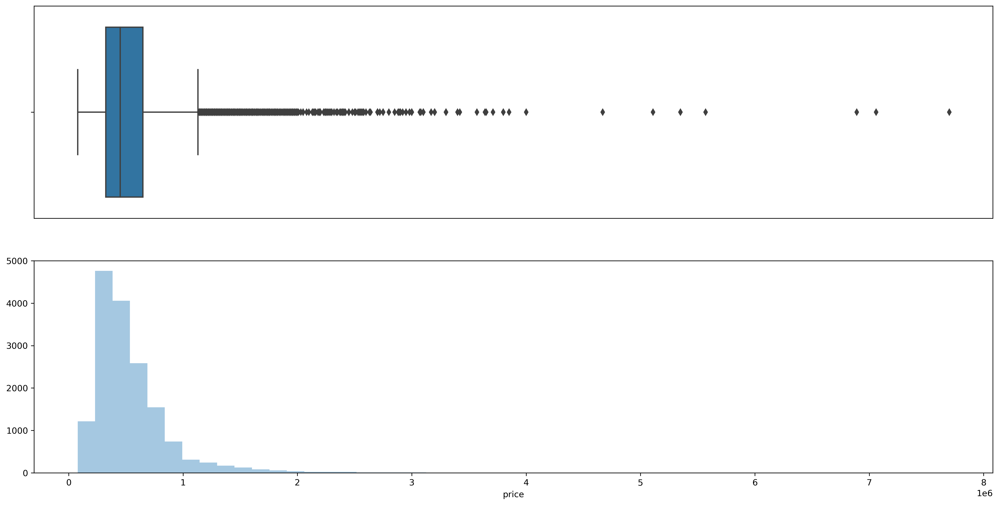

In [9]:
plot_dist('price')

In [10]:
whiskers(houses_train['price'])

(78000.0, 1130000.0)

The least value of the target `'price'` is `78000.00`. Instances with value above `1130000.00` are considered as outliers.

## Features

### `'date'`: date when object was sold

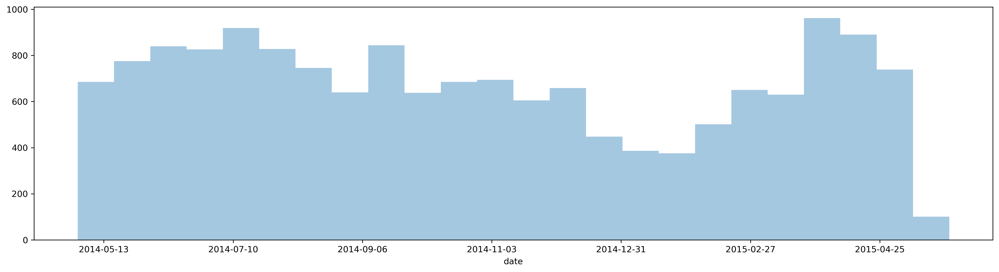

In [11]:
plt.figure(figsize=(20, 5), dpi=300)
ax = sns.distplot(houses_train['date'], kde=False)
ax.set_xticklabels([pd.to_datetime(tm).strftime('%Y-%m-%d') for tm in ax.get_xticks()])
plt.show()

There are less sales in winter.

### `'month'`: month (and year) when object was sold

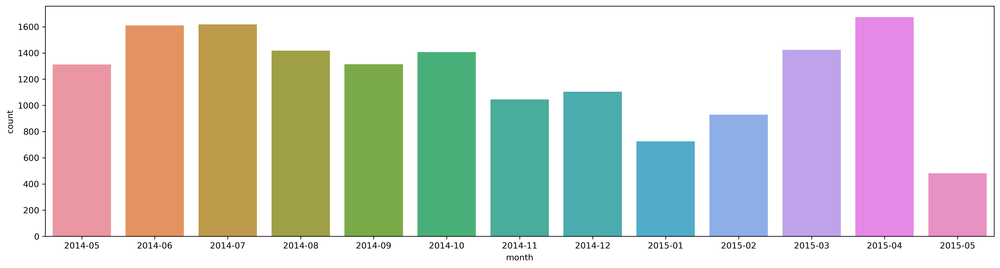

In [12]:
plot_count('month')

The fewest sales occured in January 2015 and, possibly, May 2015 (the last house sale is from May 27, 2015).

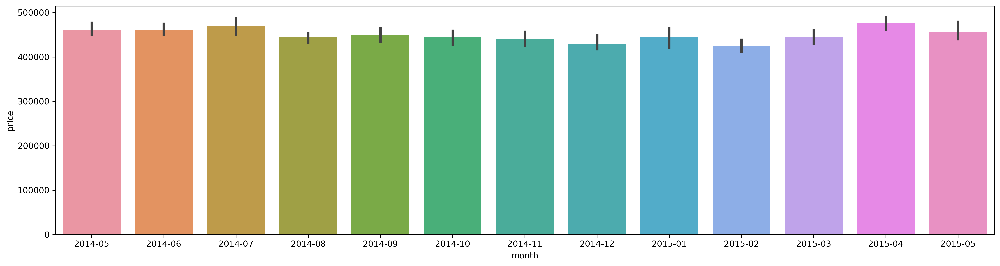

In [13]:
plot_bar_medians(group_by='month')

There are no significant differences between the medians of `'price'` grouped by `'month'`. So the feature `'month'` does not seem to be a good indicator for the target `'price'`.

### `'sqft_living'`: square footage of interior housing living space

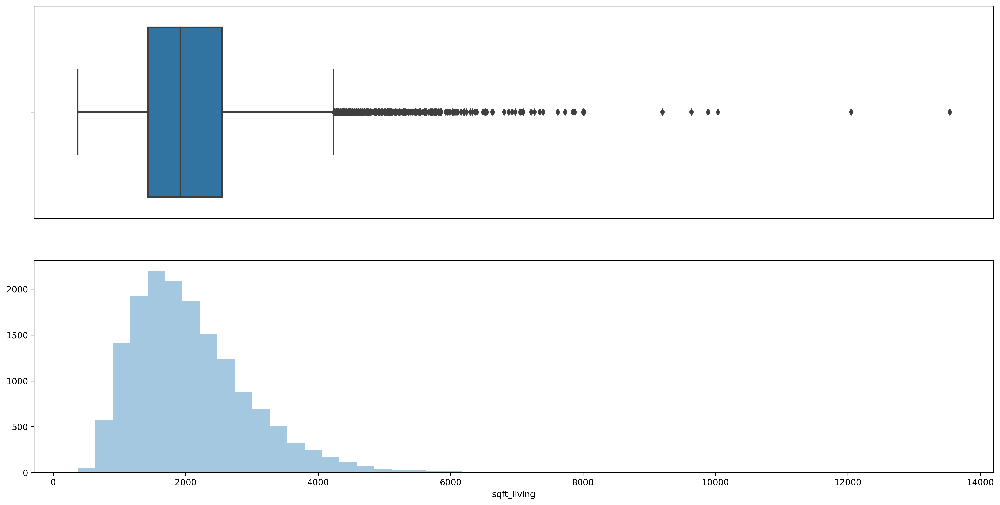

In [14]:
plot_dist('sqft_living')

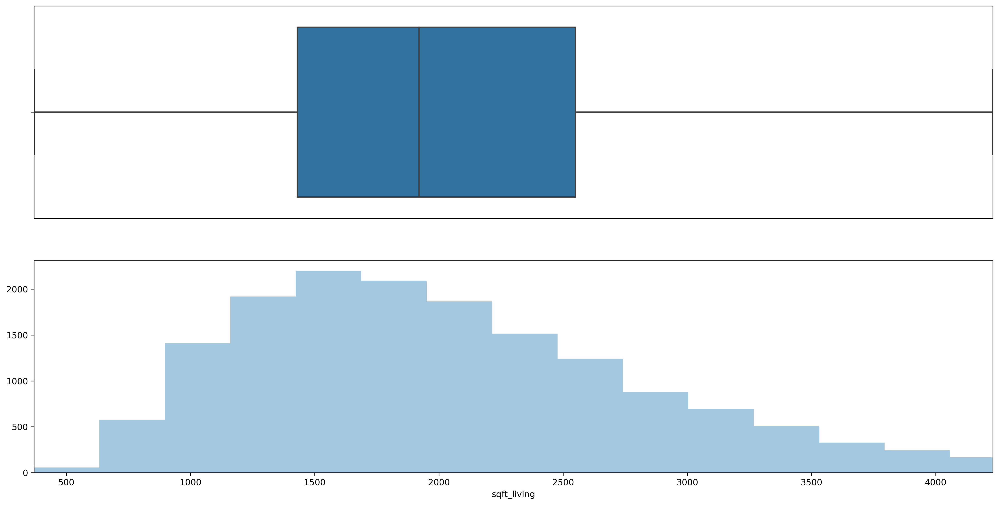

In [15]:
plot_dist('sqft_living', restricted=True)

All instances whose value of the feature `'sqft_living'` is larger than about `4200` are considered outliers (for this feature).

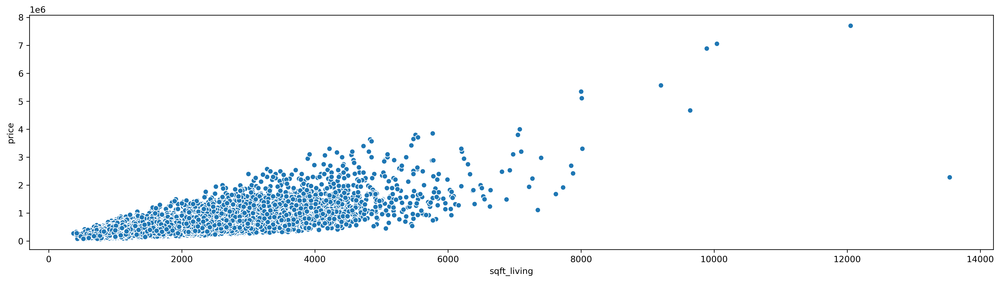

In [16]:
plot_scatter('sqft_living')

There seems to be a (rough) linear relationship between the feature `'sqft_living'` and the target `'price'`.

### `'sqft_above'`: square footage of house apart from basement

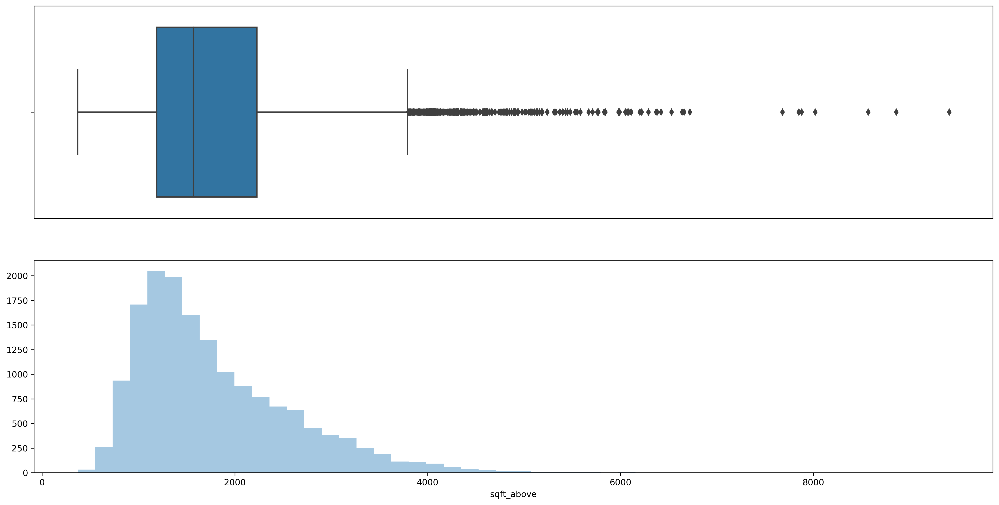

In [17]:
plot_dist('sqft_above')

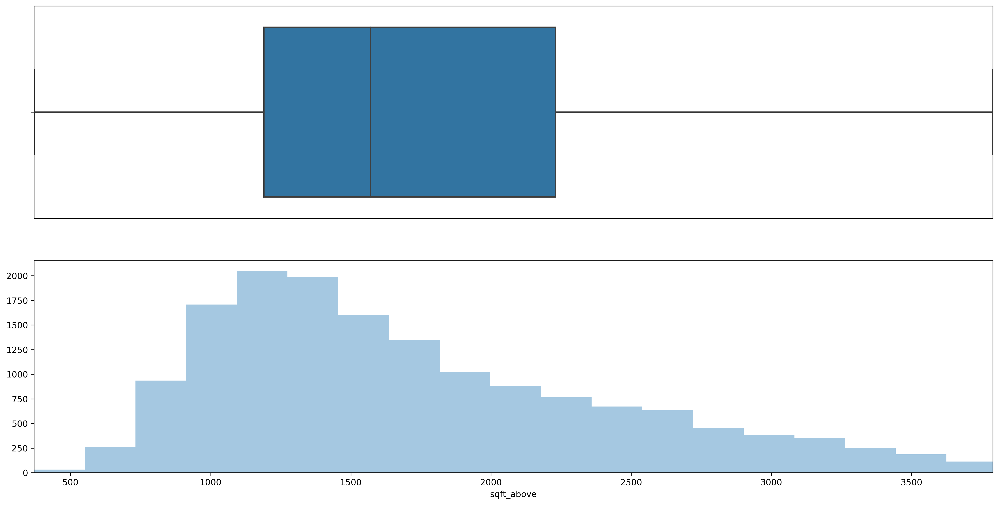

In [18]:
plot_dist('sqft_above', restricted=True)

All instances whose value of the feature `'sqft_above'` is larger than about `3700` are considered outliers (for this feature).

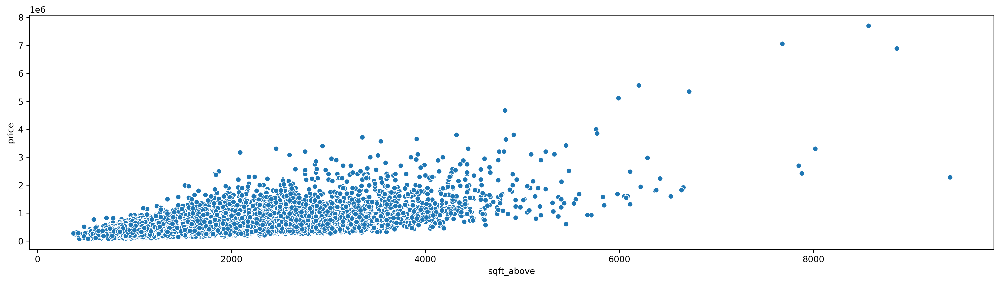

In [19]:
plot_scatter('sqft_above')

There seems to be a (rough) linear relationship between the feature `'sqft_above'` and the target `'price'`.

### `'sqft_basement'`: square footage of basement

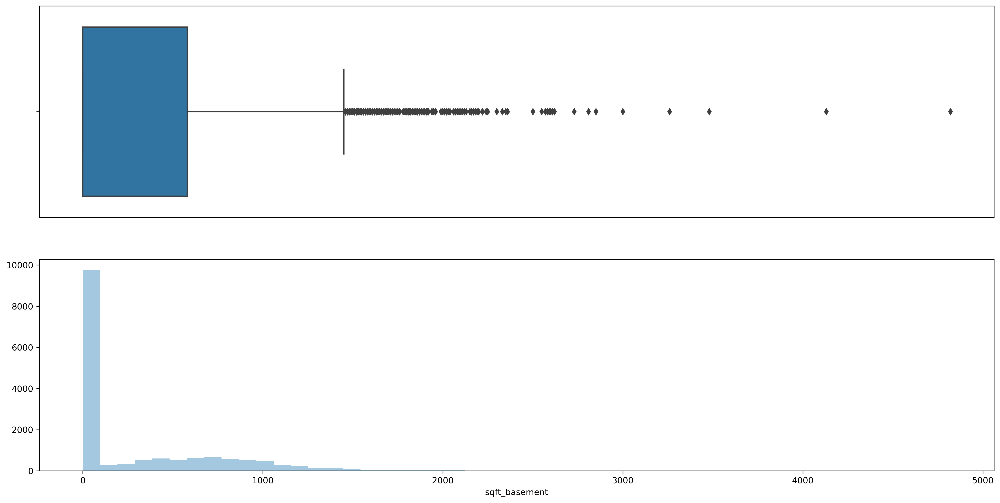

In [20]:
plot_dist('sqft_basement')

The value of the feature `'sqft_basement'` of almost `10000` instances is `0`.

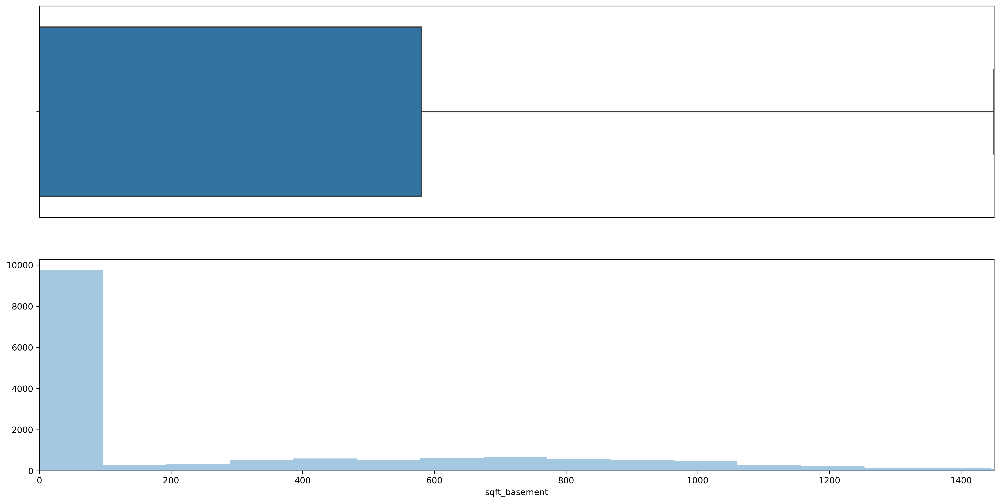

In [21]:
plot_dist('sqft_basement', restricted=True)

All instances whose value of the feature `'sqft_basement'` is larger than about `1450` are considered outliers (for this feature).

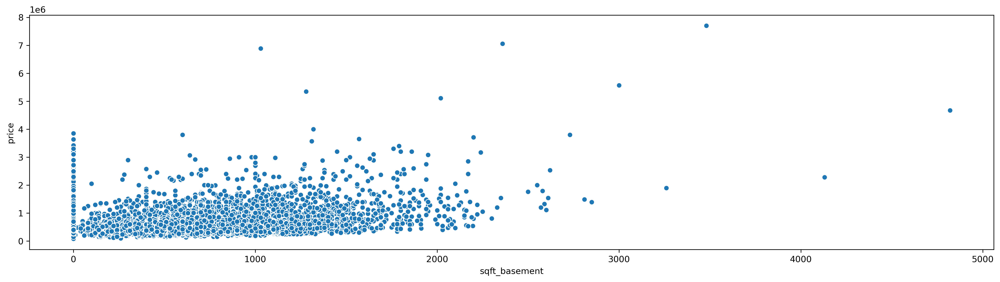

In [22]:
plot_scatter('sqft_basement')

The feature `'sqft_basement'` and the target `'price'` seem to have little correlation.

### `'has_basement'`: indicator for finished basement

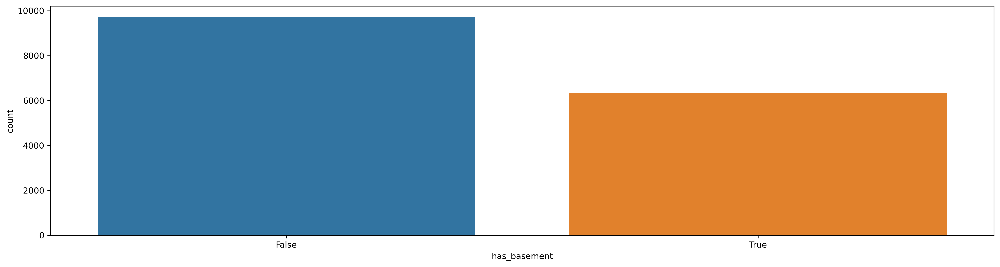

In [23]:
plot_count('has_basement')

About `6000` instances have a basement, about `10000` instances do not.

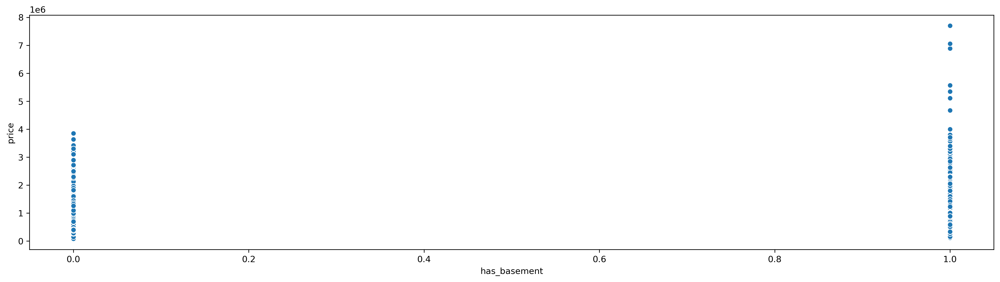

In [24]:
plot_scatter('has_basement')

The range of prices of those instances having a basement goes up to about `8000000`, the range of prices of those instances not having a basement only goes up to about `4000000`.

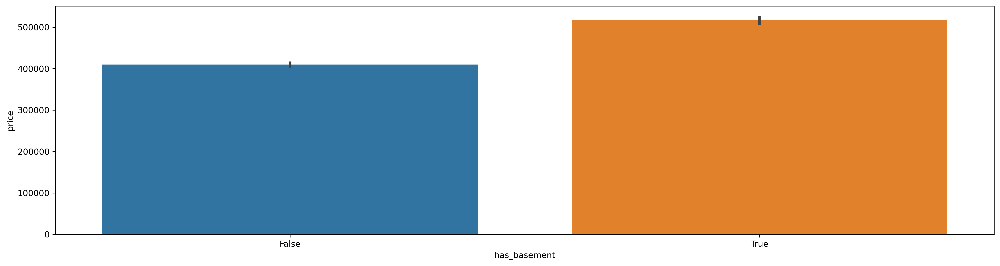

In [25]:
plot_bar_medians(group_by='has_basement')

The median of the target `'price'` of those instances having a basement is with `500000` about `100000` higher than the median of those instances not having a basement.

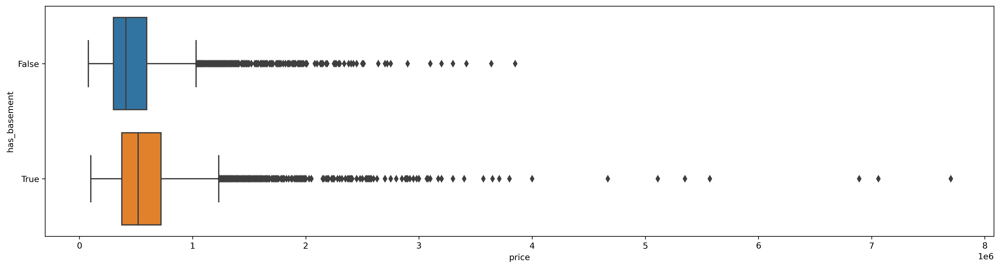

In [26]:
plot_box(group_by='has_basement')

The feature `'has_basement'` seems to be a good indicator for the target `'price'`.

### `'room_size'`: estimator for the mean room size of object

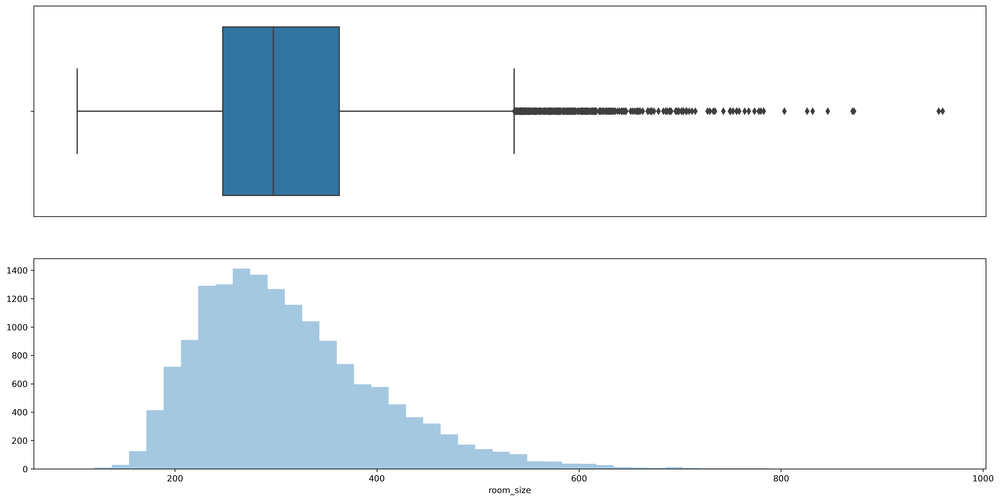

In [27]:
plot_dist('room_size')

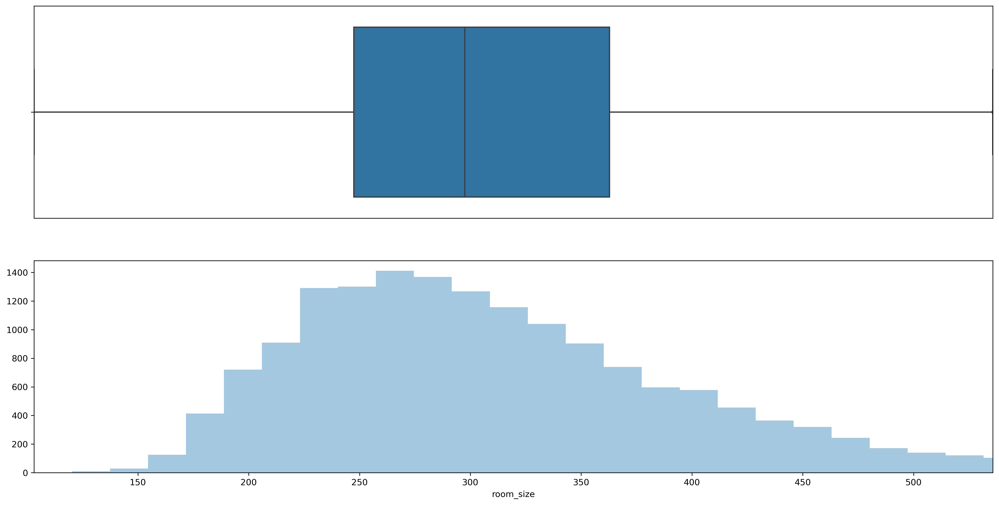

In [28]:
plot_dist('room_size', restricted=True)

All instances whose value of the feature `'room_size'` is larger than about `430` are considered outliers (for this feature).

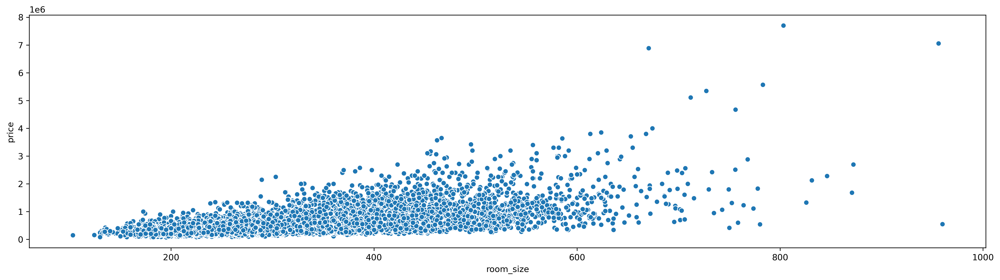

In [29]:
plot_scatter('room_size')

There seems to be a (rough) linear relationship between the feature `'room_size'` and the target `'price'`.

### `'base_area'`: estimator for the base area of object

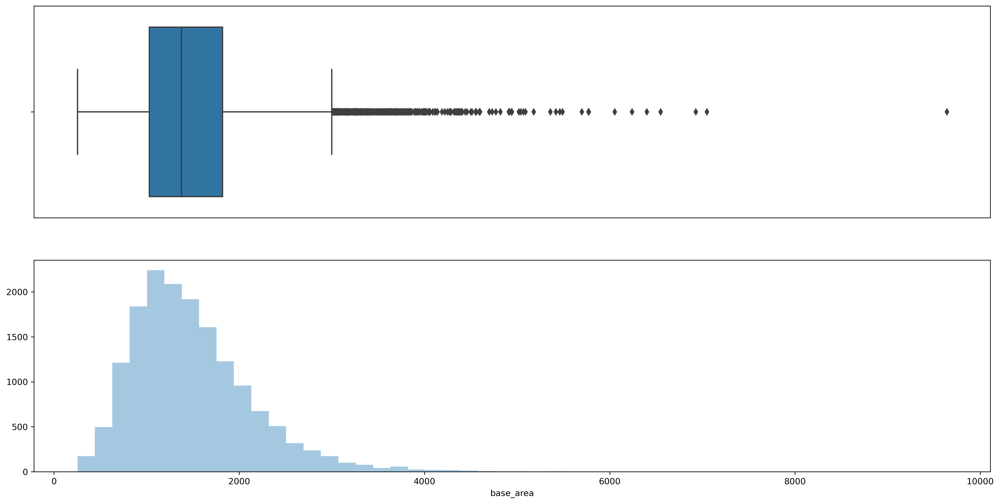

In [30]:
plot_dist('base_area')

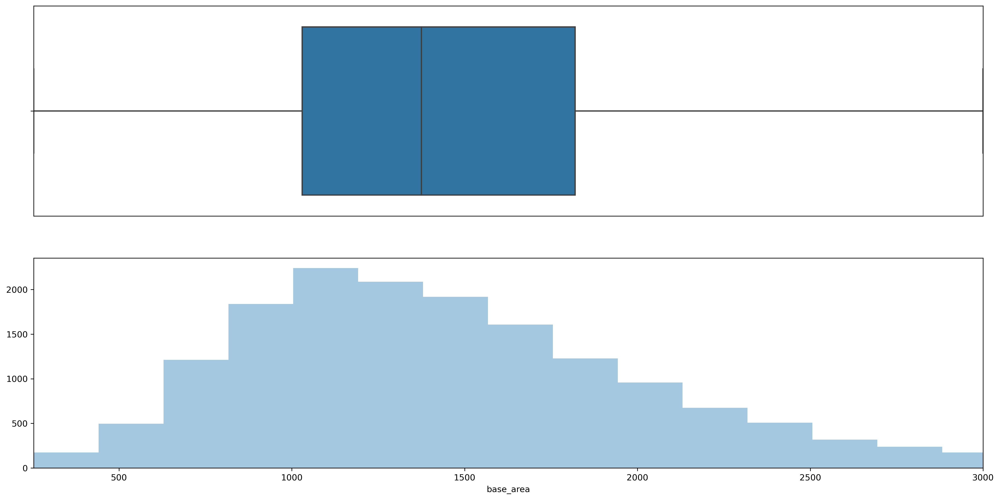

In [31]:
plot_dist('base_area', restricted=True)

All instances whose value of the feature `'room_size'` is larger than about `3000` are considered outliers (for this feature).

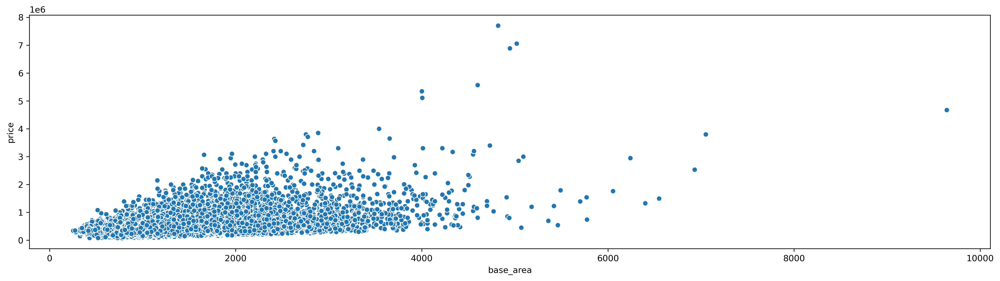

In [32]:
plot_scatter('base_area')

There seems to be a (rough) linear relationship between the feature `'base_area'` and the target `'price'`.

### `'sqft_lot'`: square footage of land lot

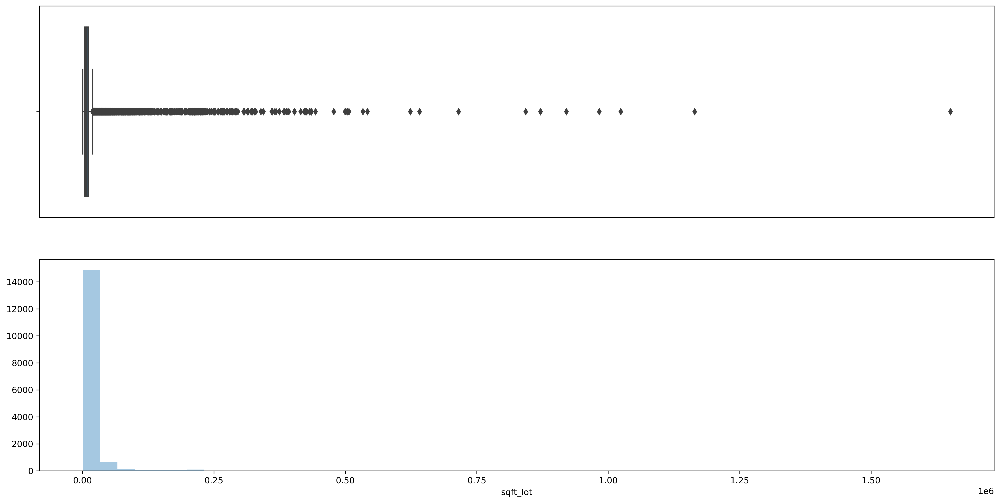

In [33]:
plot_dist('sqft_lot')

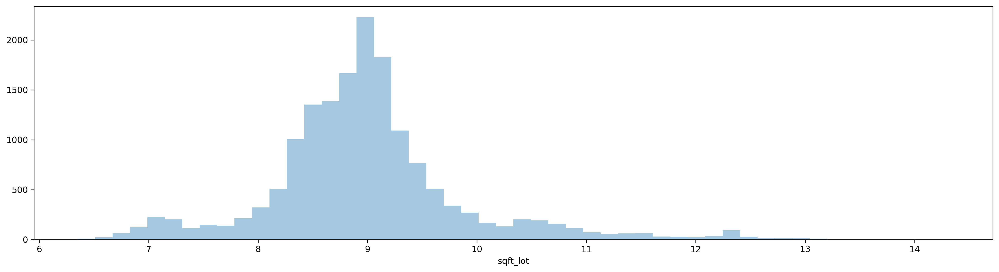

In [34]:
plt.figure(figsize=(20, 5), dpi=300)
sns.distplot(np.log(houses_train['sqft_lot'] + 1), kde=False)
plt.show()
# XXX BENUTZEN!!!

The values of the outliers for the feature `'sqft_lot'` are extremely high.

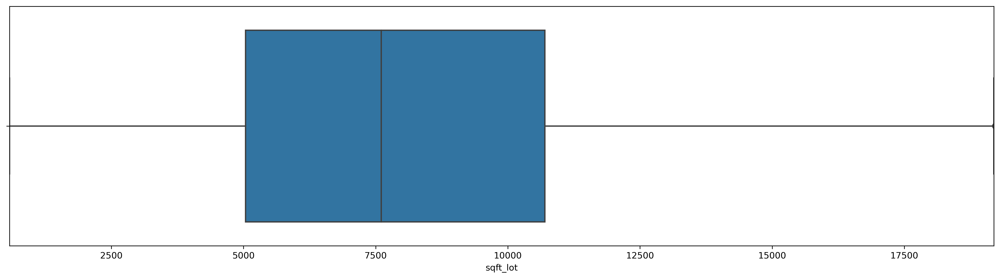

In [35]:
plot_box('sqft_lot', restricted=True)

All instances whose value of the feature `'sqft_lot'` is larger than about `19000` are considered outliers (for this feature).

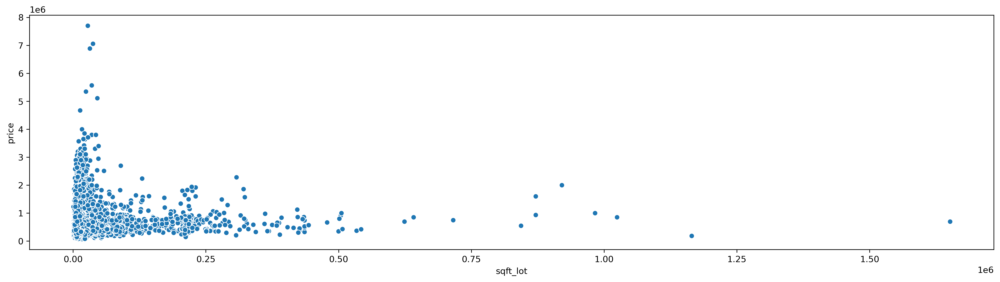

In [36]:
plot_scatter('sqft_lot')

The feature `'sqft_lot'` and the target `'price'` seem to have little correlation.

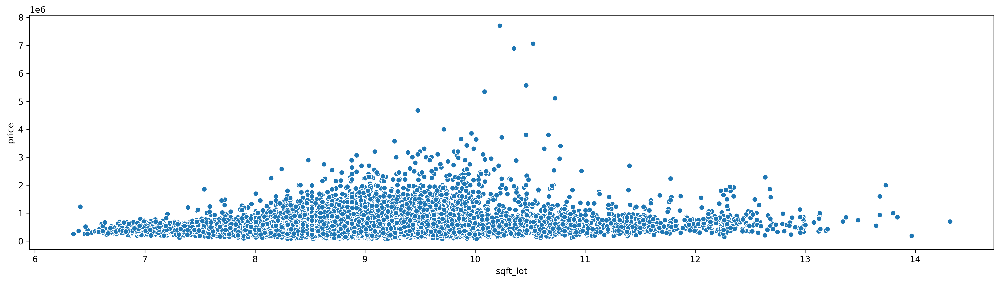

In [37]:
plot_scatter(np.log(houses_train['sqft_lot'])) # XXX???XXX

### `'sqft_living15'`: square footage of interior housing living space for the nearest 15 neighbors

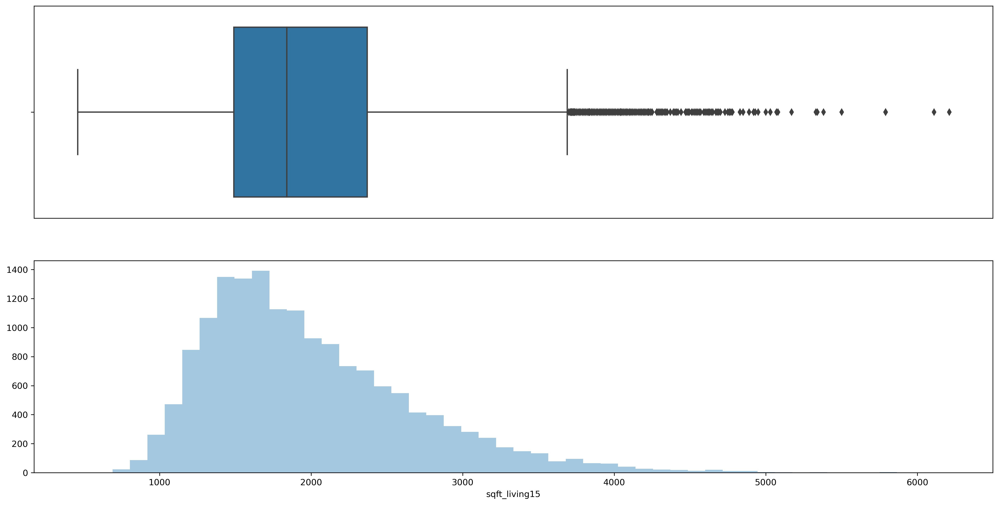

In [38]:
plot_dist('sqft_living15')

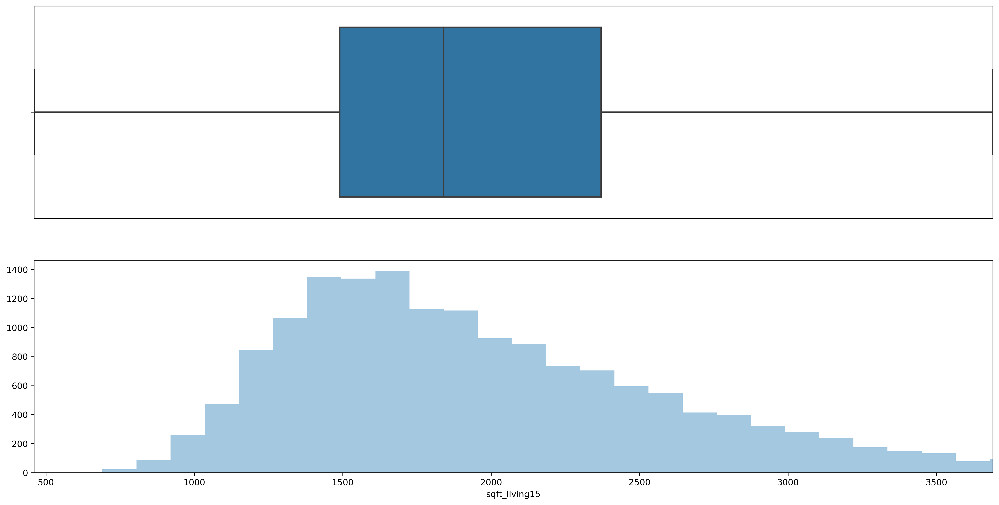

In [39]:
plot_dist('sqft_living15', restricted=True)

All instances whose value of the feature `'sqft_living'` is larger than about `3700` are considered outliers (for this feature).

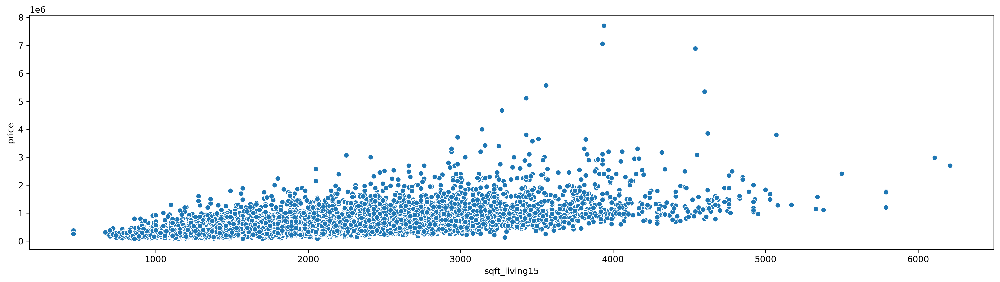

In [40]:
plot_scatter('sqft_living15')

There seems to be a (rough) linear relationship between the feature `'sqft_living15'` and the target `'price'`.

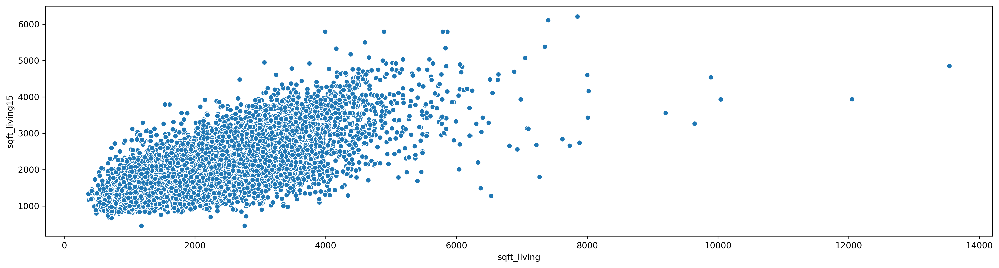

In [41]:
plot_scatter('sqft_living', 'sqft_living15')

There seems to be a (rough) linear relationship between the features `'sqft_living'` and `'sqft_living15'`.

### `'sqft_lot15'`: square footage of land lots of the nearest 15 neighbors

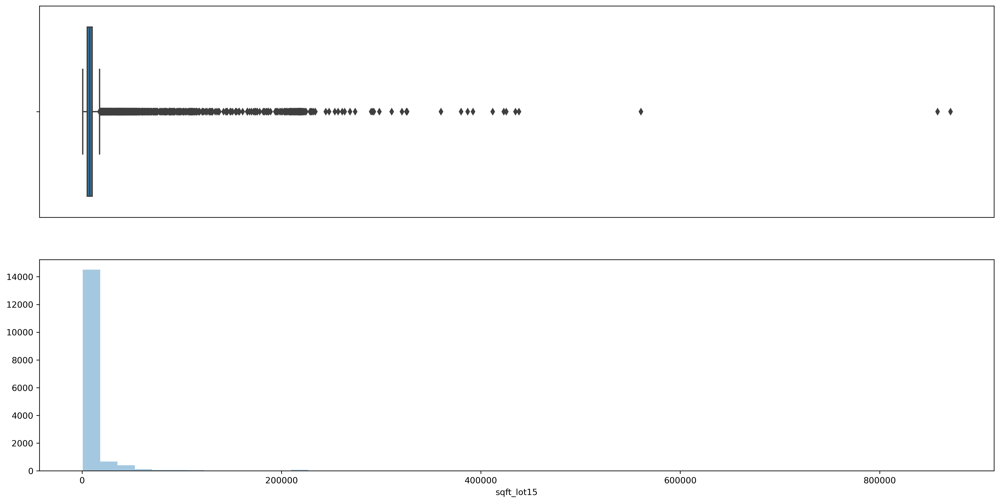

In [42]:
plot_dist('sqft_lot15')

The values of the outliers for the feature `'sqft_lot15'` are extremely high.

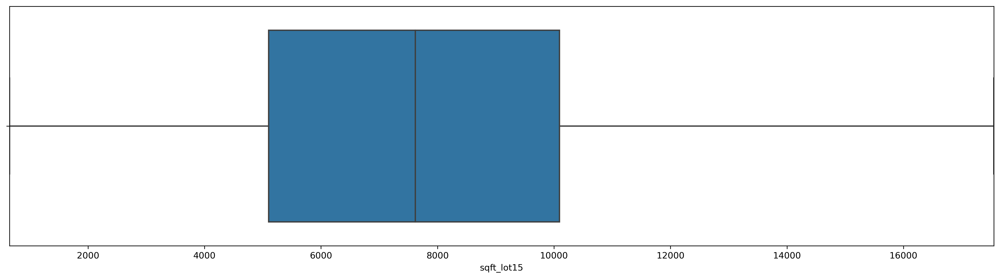

In [43]:
plot_box('sqft_lot15', restricted=True)

All instances whose value of the feature `'sqft_lot15'` is larger than about `15000` are considered outliers (for this feature).

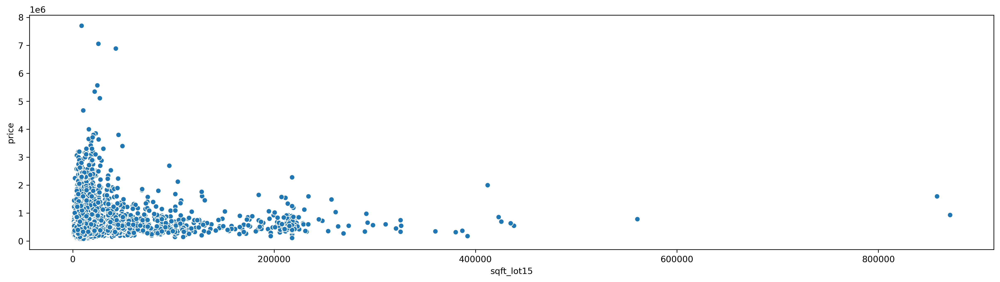

In [44]:
plot_scatter('sqft_lot15')

The feature `'sqft_lot15'` and the target `'price'` seem to have little correlation.

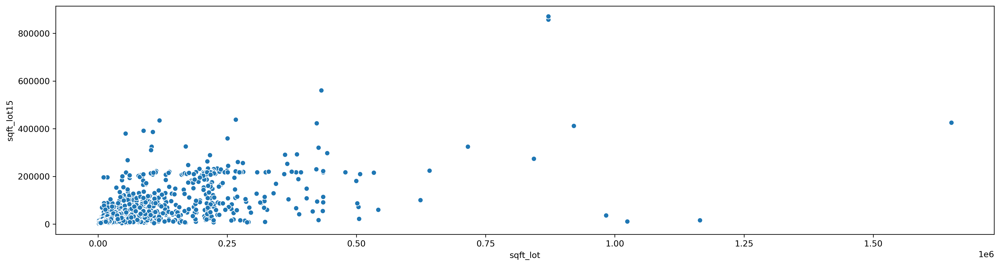

In [45]:
plot_scatter('sqft_lot', 'sqft_lot15')

There seems to be a (rough) linear relationship between the features `'sqft_lot'` and `'sqft_lot15'`.

### `'bedrooms'`: number of bedrooms in house

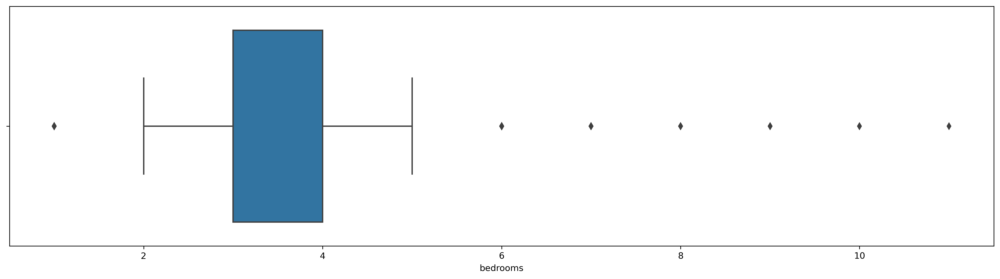

In [46]:
plot_box('bedrooms')

All instances whose value of the feature `'bedrooms'` is smaller than `2` or larger than `5` are considered outliers (for this feature).

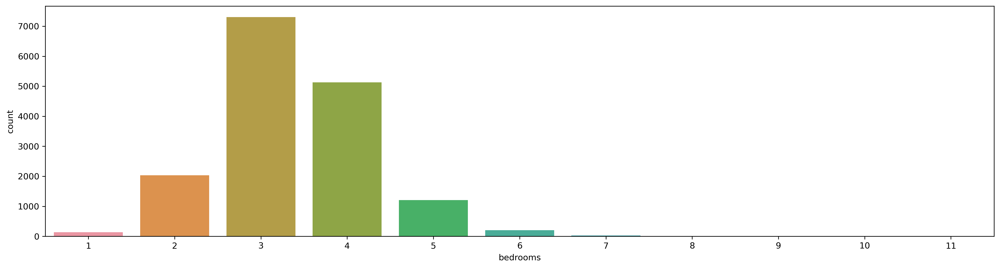

In [47]:
plot_count('bedrooms')

Most objects have `3` or `4` bedrooms.

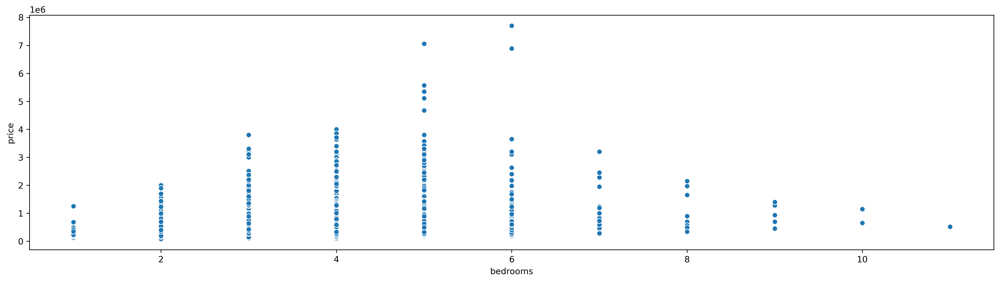

In [48]:
plot_scatter('bedrooms')

The range of prices increases with increasing number of bedrooms up to an amount of about `6`. After this value, the range of prices decreases.

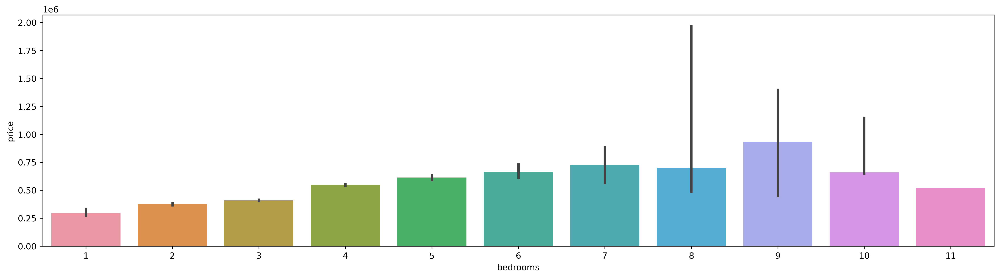

In [49]:
plot_bar_medians(group_by='bedrooms')

There is a rough linear relationship between the feature `'bedrooms'` up to value `6` and the target `'price'`, for values larger than 6 there seems to be no (positive) correlation.

The quality of the feature `'bedrooms'` to predict the target `'price'` seems to be limited.

### `'bedrooms bin'`: category of number of bedrooms

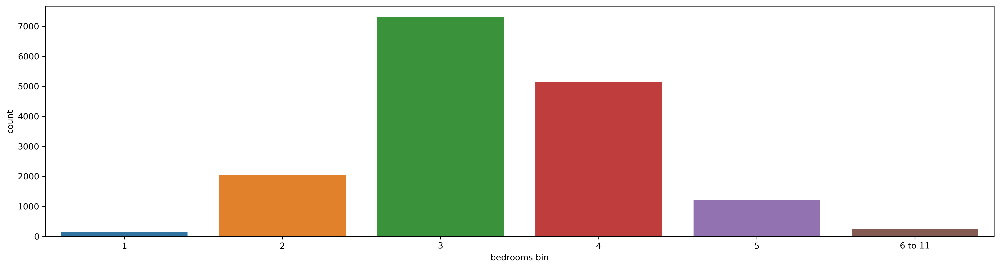

In [50]:
plot_count('bedrooms bin')

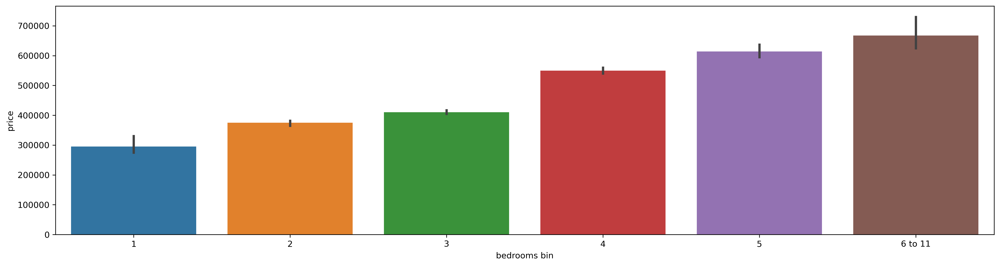

In [51]:
plot_bar_medians(group_by='bedrooms bin')

With increasing value of the feature `'bedrooms bin'`, we obtain increasing medians of the target `'price'`.

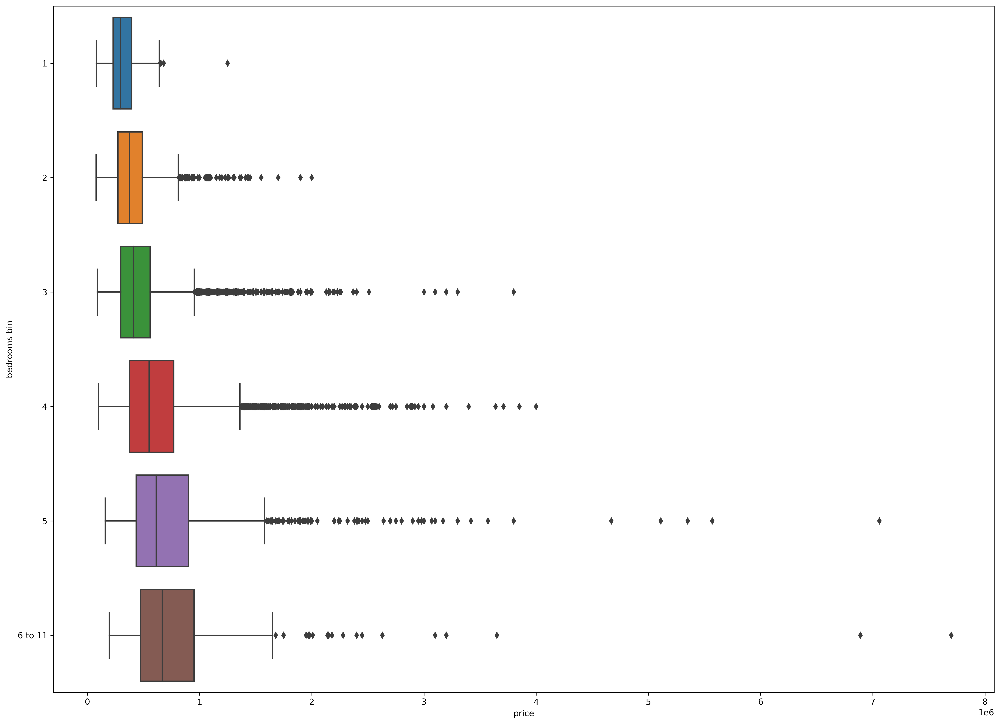

In [52]:
plot_box(group_by='bedrooms bin')

### `'bathrooms'`: number of bathrooms in house

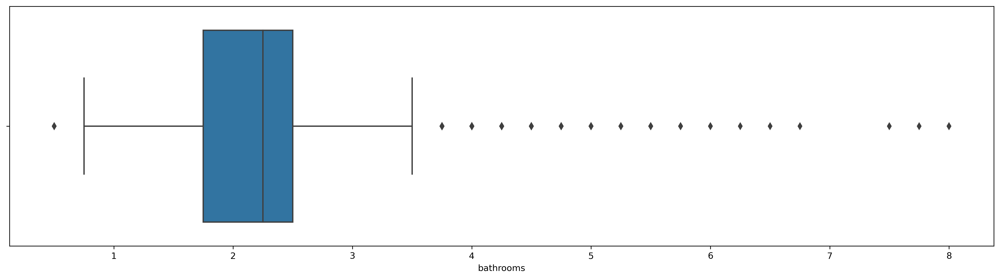

In [53]:
plot_box('bathrooms')

All instances whose value of the feature `'bathrooms'` is smaller than `0.75` or larger than `3.5` are considered outliers (for this feature).

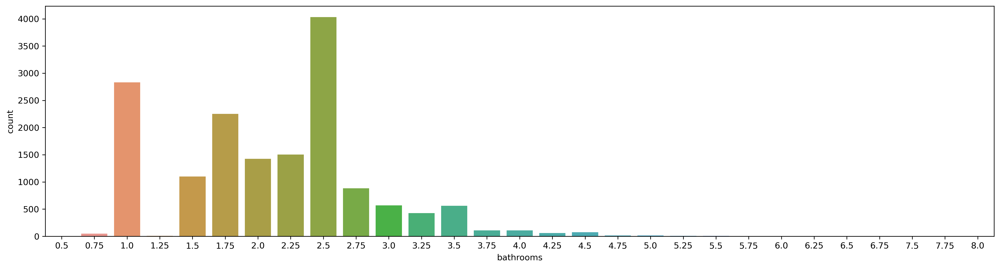

In [54]:
plot_count('bathrooms')

Most objects have about `2` bathrooms.

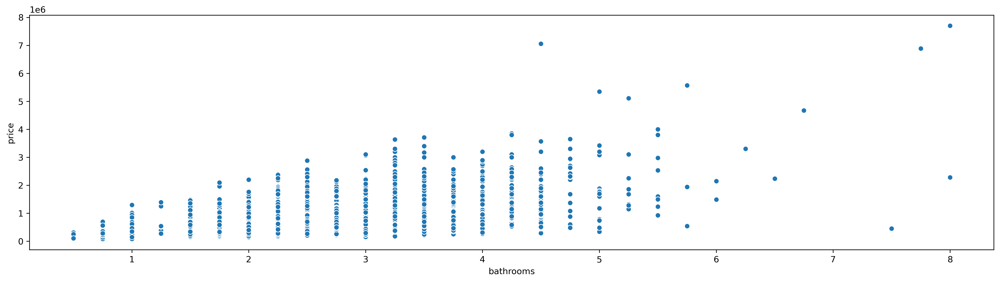

In [55]:
plot_scatter('bathrooms')

There is a (rough) linear relationship between the feature `'bathrooms'` and the target `'price'`.

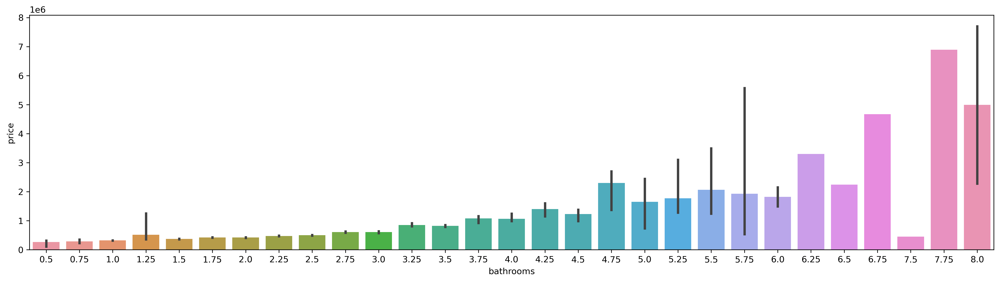

In [56]:
plot_bar_medians(group_by='bathrooms')

The quality of the feature `'bathrooms'` to predict the target `'price'` seems to be limited.

### `'bathrooms bin'`: category of number of bathrooms

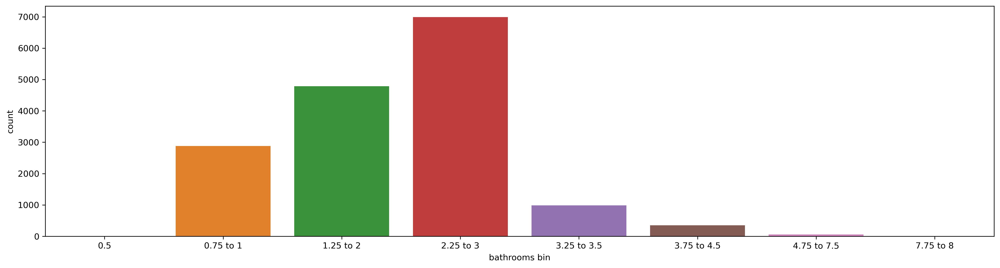

In [57]:
plot_count('bathrooms bin')

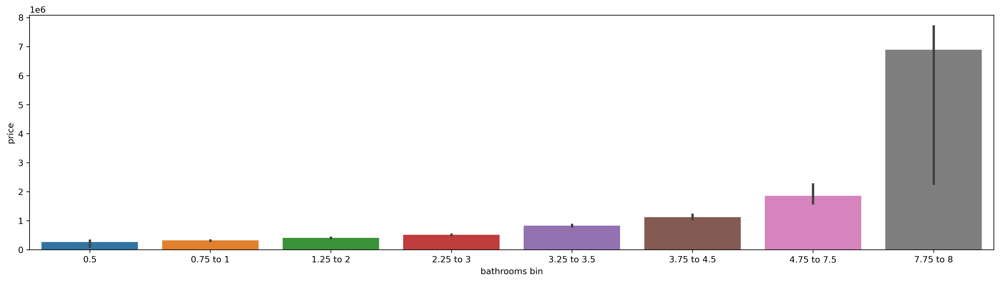

In [58]:
plot_bar_medians(group_by='bathrooms bin')

This looks like a exponential funktion. Applying log yields:

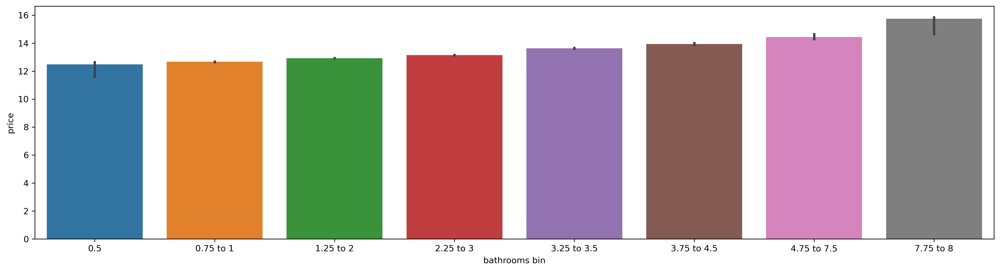

In [59]:
plot_bar_log_medians(group_by='bathrooms bin')

With increasing value of the feature `'bathrooms bin'` we obtain exponentially increasing medians of the target `'price'`.

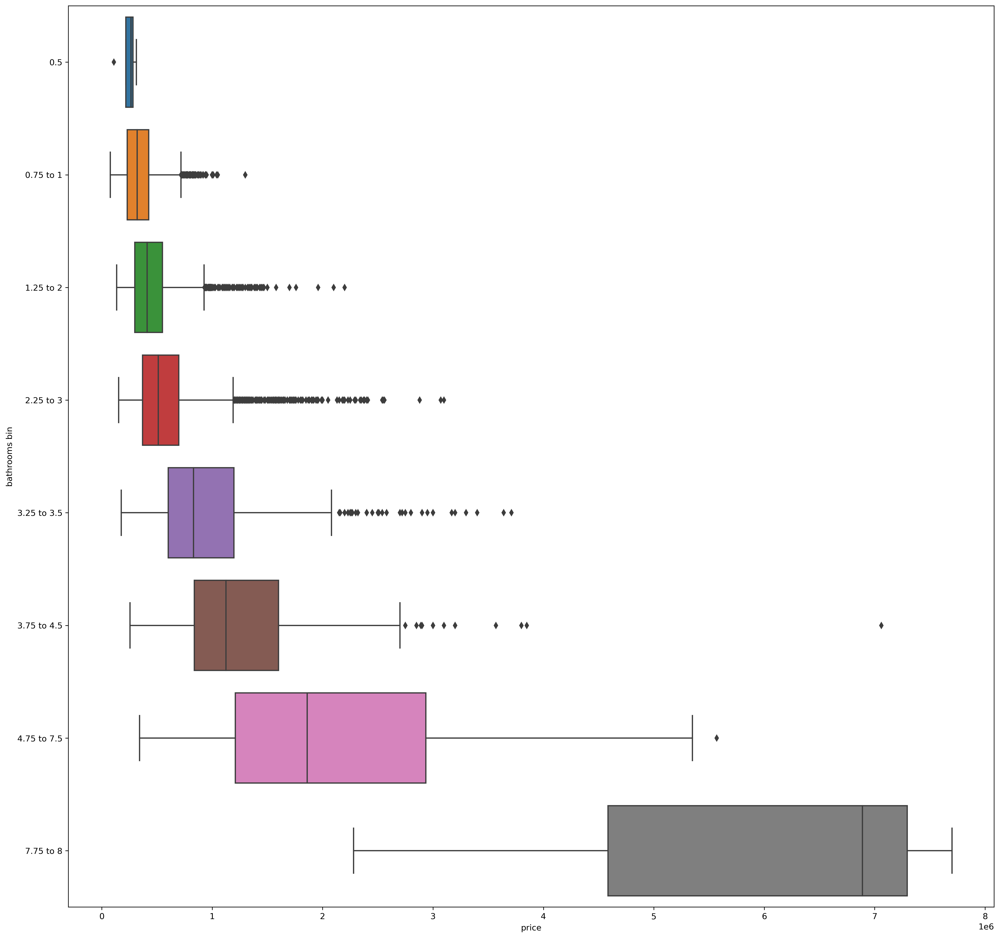

In [60]:
plot_box(group_by='bathrooms bin')

The feature `'bathrooms bin'` seems to be a quite good indicator for the target `'price'`.

### `'bathrooms_ratio'`: estimator for bath share of object

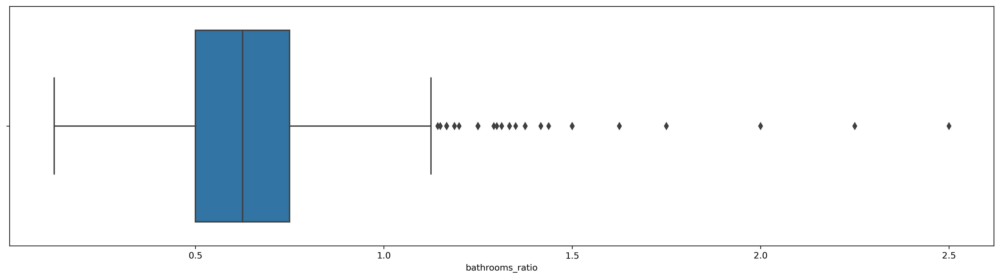

In [61]:
plot_box('bathrooms_ratio')

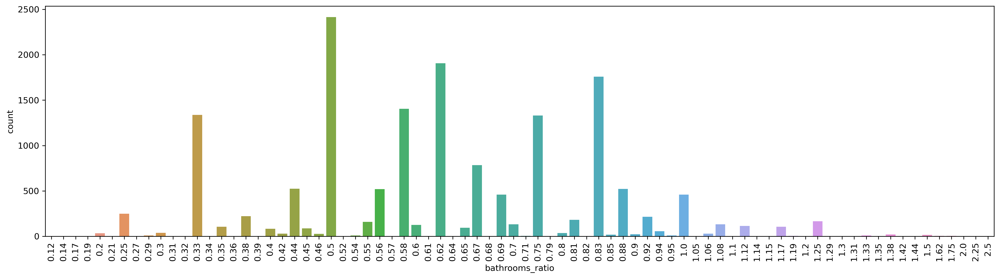

In [62]:
plot_count(np.round(houses_train['bathrooms_ratio'], 2), vertical=True)

All instances whose value of the feature `'bathrooms_share'` is larger than about `1.12` are considered outliers (for this feature).

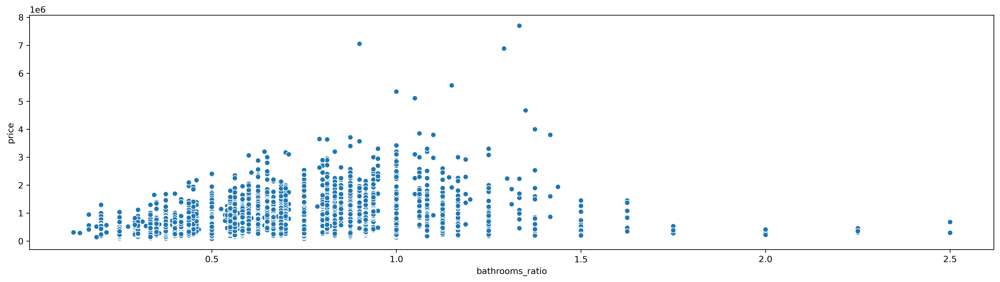

In [63]:
plot_scatter('bathrooms_ratio')

The range of prices increases with increasing value of the feature `'bathrooms_ratio'` up to a value of about `1.4`. After this values, the range of prices decreases drastically.

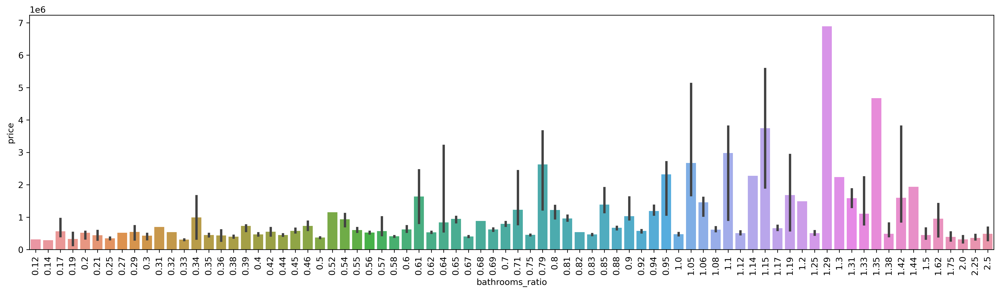

In [64]:
plot_bar_medians(group_by=np.round(houses_train['bathrooms_ratio'], 2), vertical=True)

The feature `'bathrooms_ratio'` and the target `'price'` seem to have little correlation.

The quality of the feature `'bathrooms_ratio'` to predict the target `'price'` seems to be limited.

### `'bathrooms_ratio bin'`: category of bath share

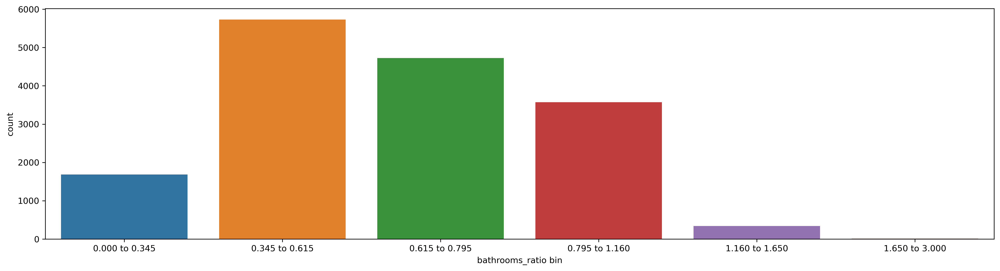

In [65]:
plot_count('bathrooms_ratio bin')

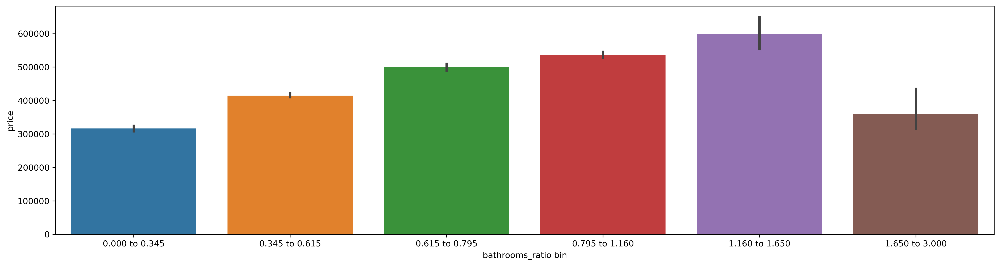

In [66]:
plot_bar_medians(group_by='bathrooms_ratio bin')

With increasing value of the feature `'bathrooms_ratio bin'` up to the value `'1.160 to 1.650'`, we obtain increasing medians of the target `'price'`.

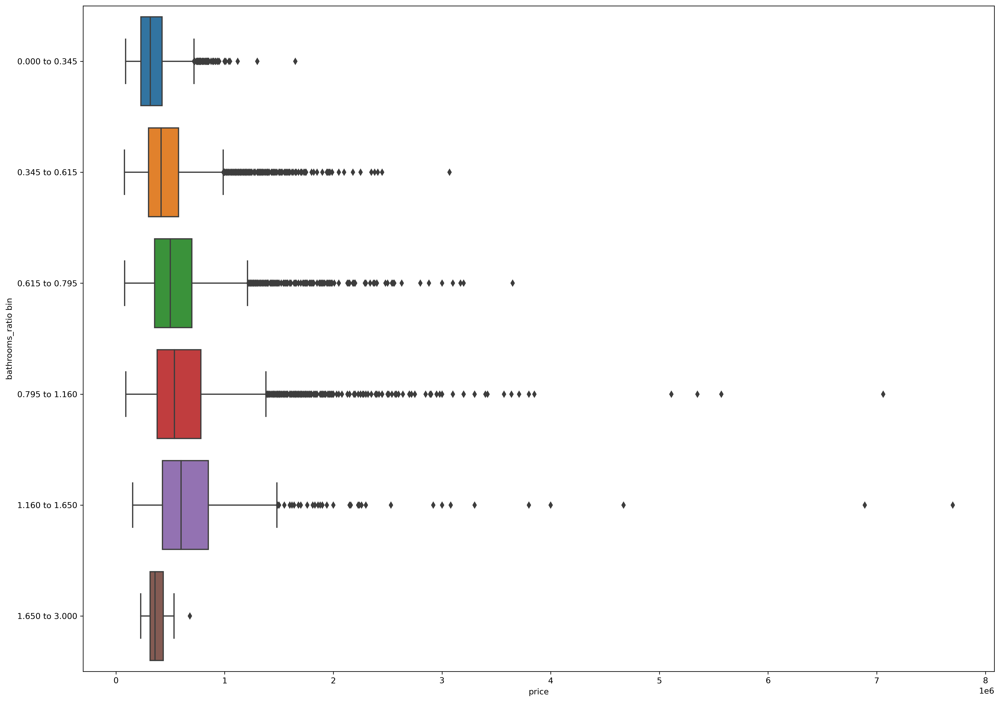

In [67]:
plot_box(group_by='bathrooms_ratio bin')

The quality of the feature `'bathrooms_ratio bin'` to predict the target `'price'` still seems to be limited.

### `'floors'`: total floors (levels) in house

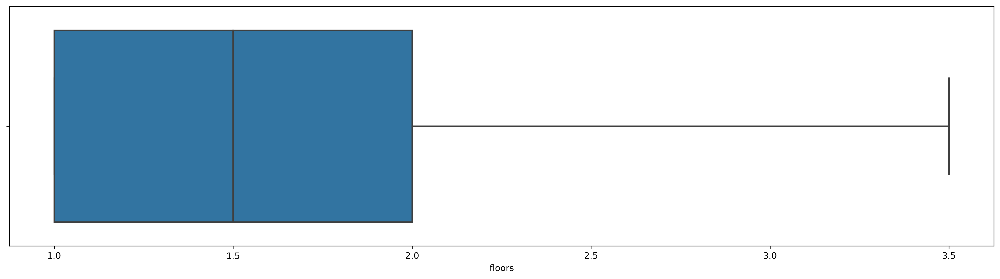

In [68]:
plot_box('floors')

All instances whose value of the feature `'floors'` is larger than `2` are considered outliers (for this feature).

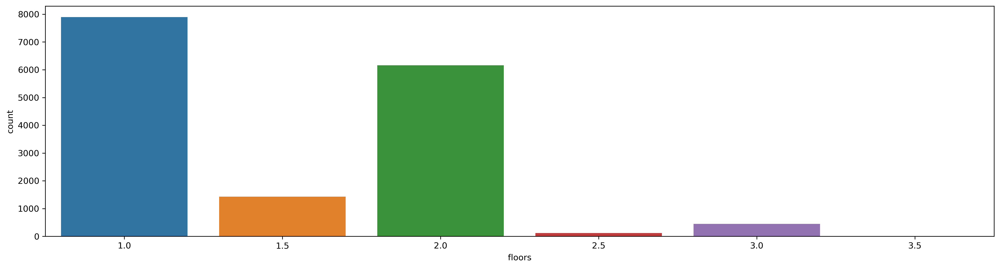

In [69]:
plot_count('floors')

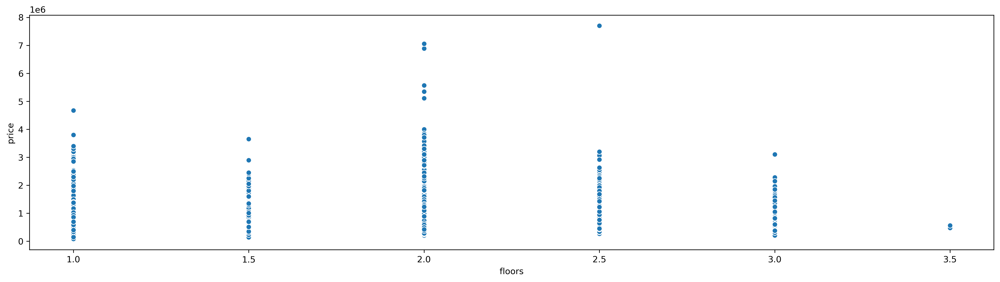

In [70]:
plot_scatter('floors')

The feature `'floors'` and the target `'price'` seem to have little correlation.

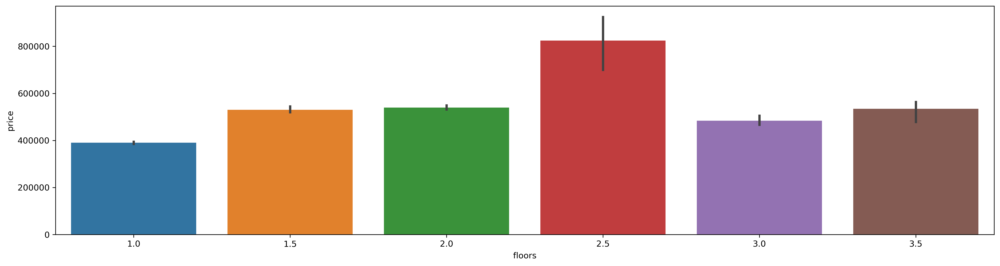

In [71]:
plot_bar_medians(group_by='floors')

The quality of the feature `'floors'` to predict the target `'price'` seems to be limited.

### `'floors bin'`: category of number of total floors

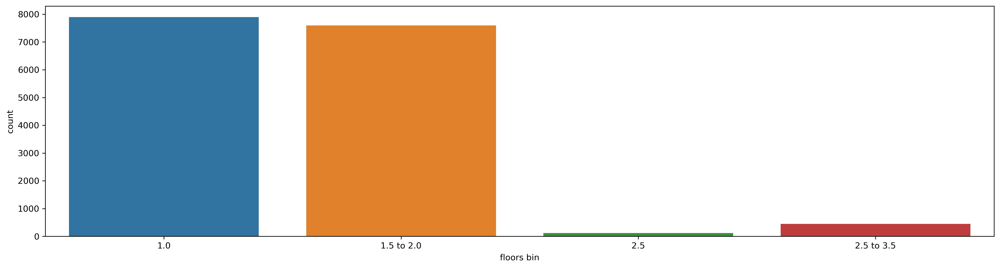

In [72]:
plot_count('floors bin')

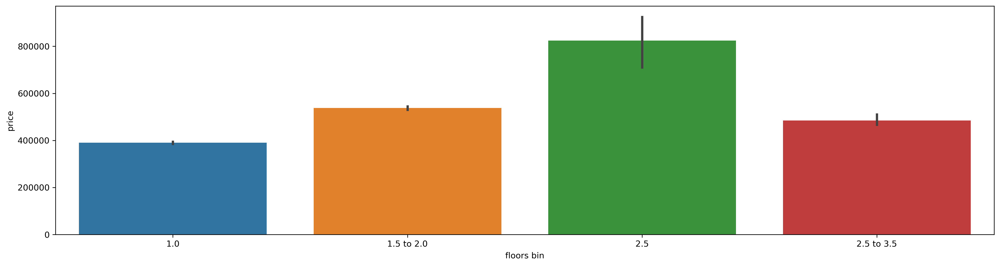

In [73]:
plot_bar_medians(group_by='floors bin')

With increasing value of the feature `'floors bin'` up to the value `'2.5'`, we obtain increasing medians of the target `'price'`. After this maximum, the median of the target `'price'` decreases again. 

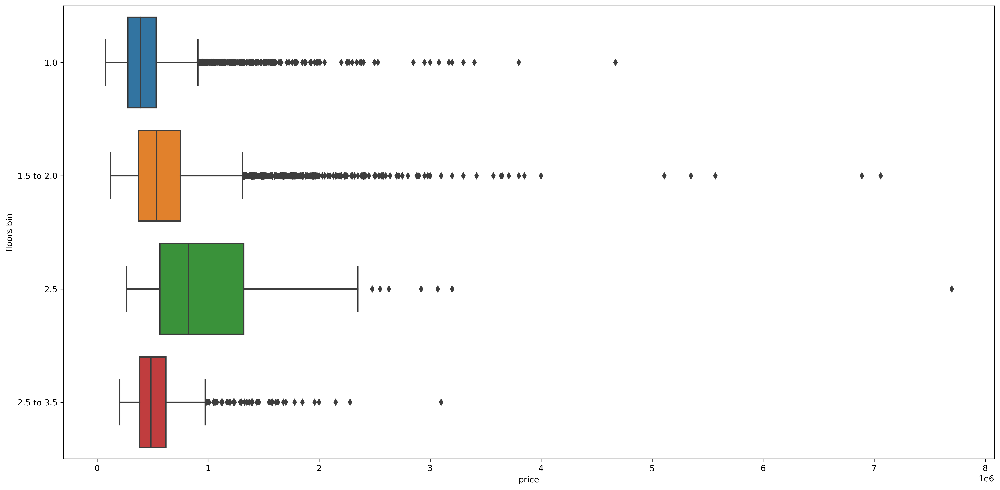

In [74]:
plot_box(group_by='floors bin')

The quality of the feature `'floors bin'` to predict the target `'price'` still seems to be limited.

### `'yr_built'`: year when house was built

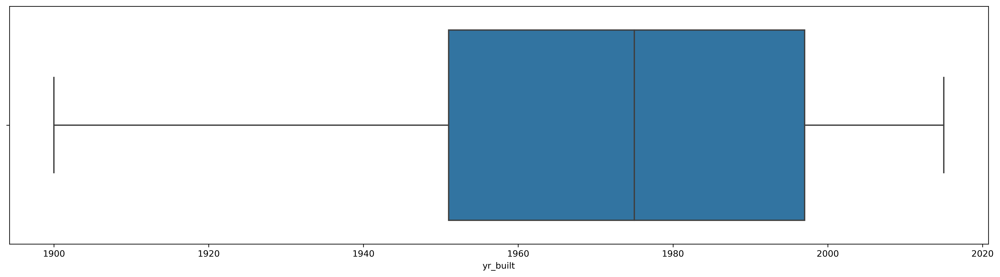

In [75]:
plot_box('yr_built')

There are no outliers for the feature `'yr_built'`.

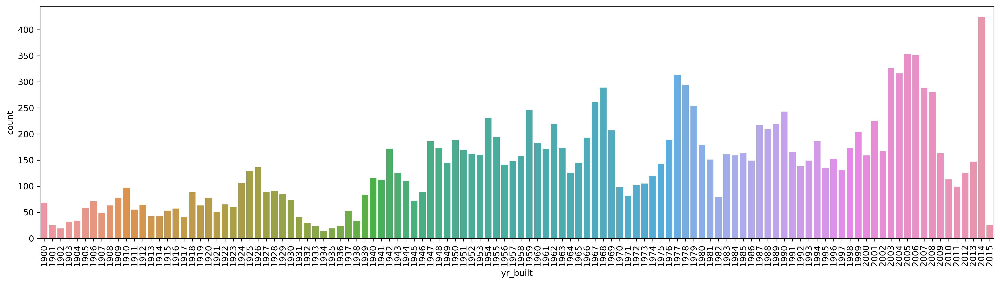

In [76]:
plot_count('yr_built', vertical=True)

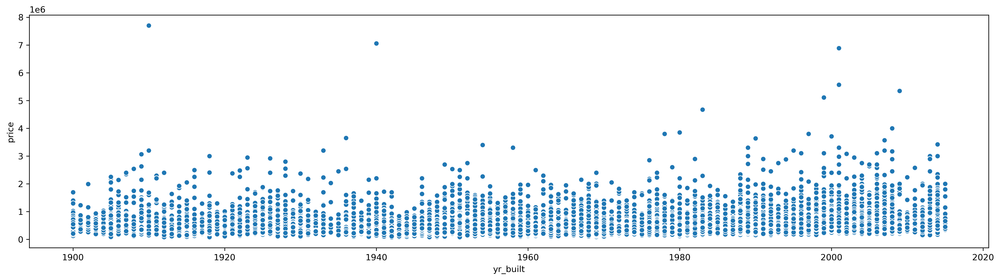

In [77]:
plot_scatter('yr_built')

The feature `'yr_built'` and the target `'price'` seem to have little correlation.

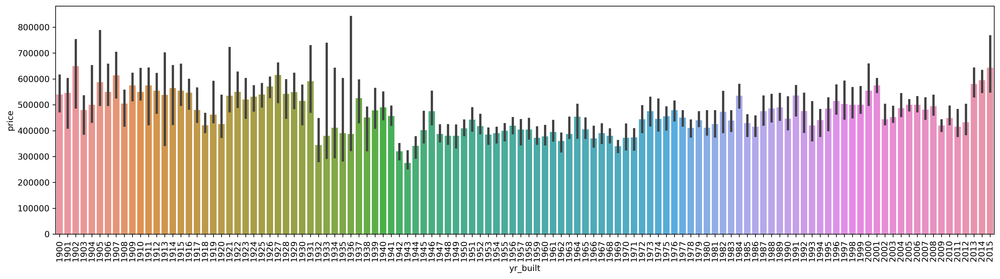

In [78]:
plot_bar_medians(group_by='yr_built', vertical=True)

The feature `'yr_built'` seems to have little predictive power for the target `'price'`.

### `'decade_built'`: decade when house was built

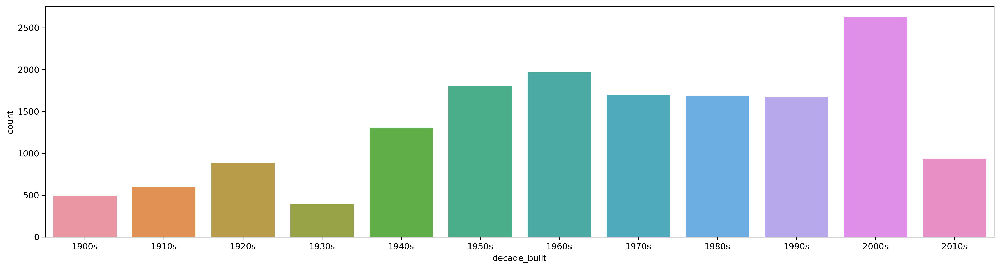

In [79]:
plot_count('decade_built')

The objects built in the first decade of the 21st century have the highest count. Old houses (up to 1930s) are comparatively rare.

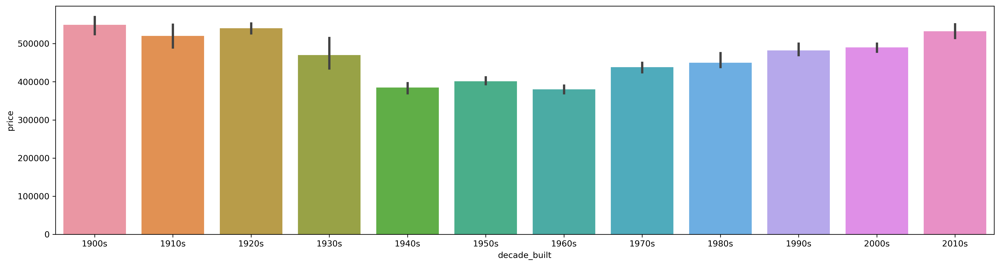

In [80]:
plot_bar_medians(group_by='decade_built')

The medians of the target `'price'` is smaller if the value of the feature `'decade_built'` is from `'1940s'` to `'1980s'`. Old objects (up to 1930s) and new objects (after 1990s) achieve higher sale prices.

### `'yr_built bin'`: category of year when house was built

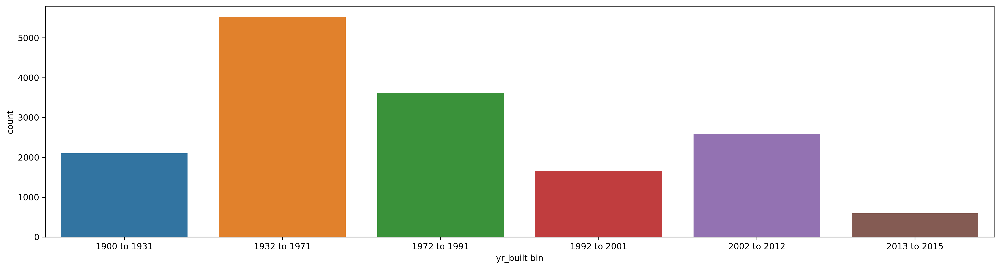

In [81]:
plot_count('yr_built bin')

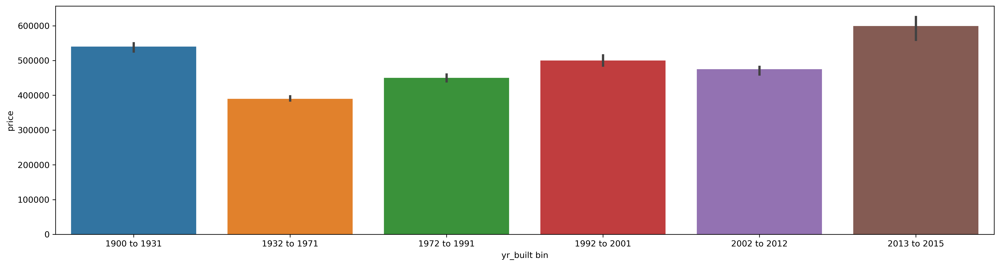

In [82]:
plot_bar_medians(group_by='yr_built bin')

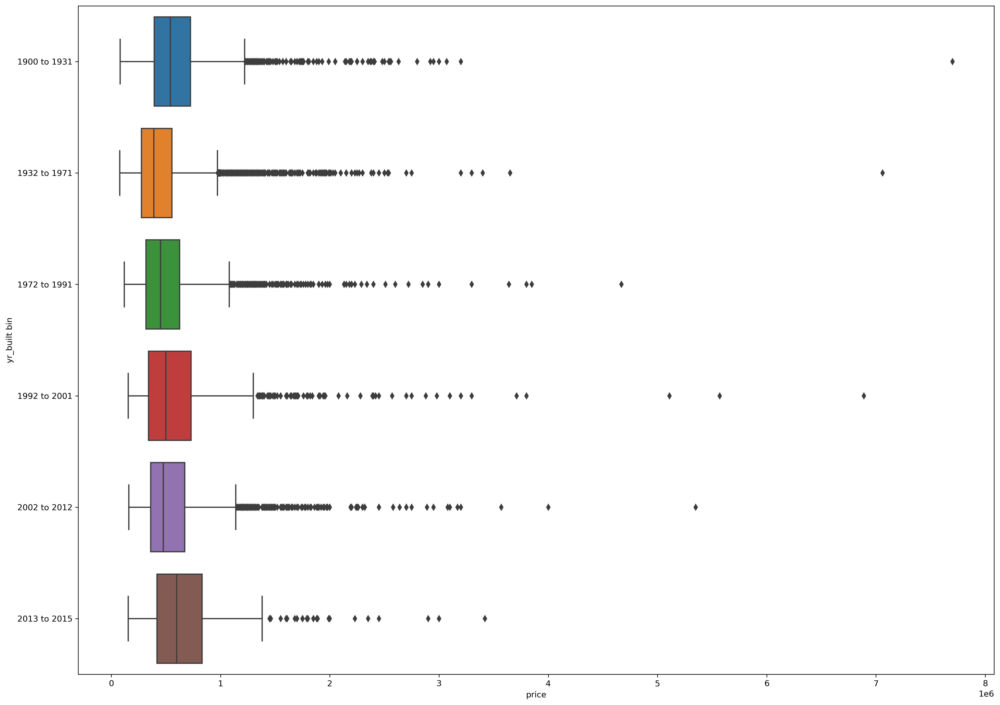

In [83]:
plot_box(group_by='yr_built bin')

### `'yr_renovated'`: year when house was renovated

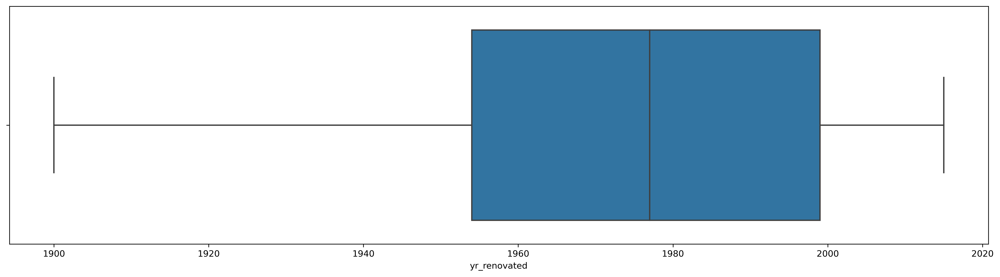

In [84]:
plot_box('yr_renovated')

There are not outliers for the feature `'yr_renovated'`.

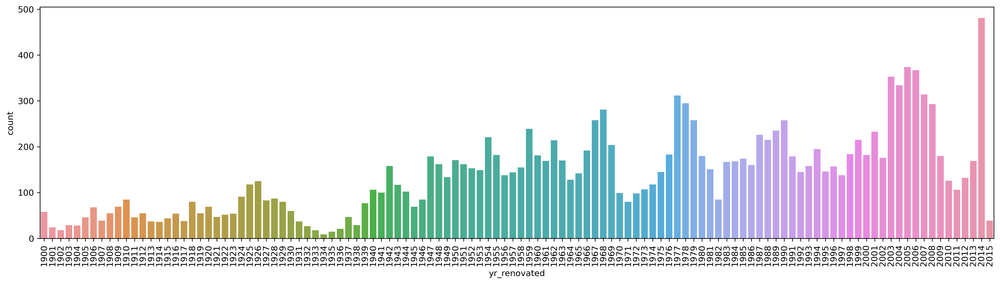

In [85]:
plot_count('yr_renovated', vertical=True)

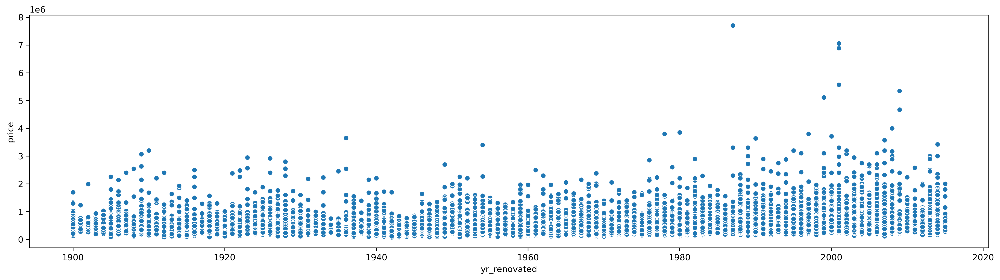

In [86]:
plot_scatter('yr_renovated')

The feature `'yr_renovated'` and the target `'price'` seem to have little correlation.

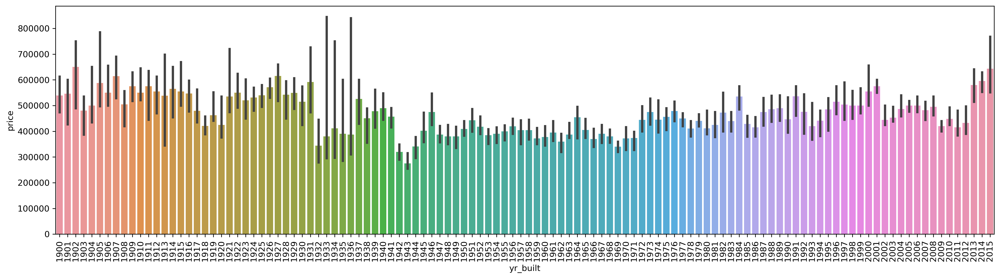

In [87]:
plot_bar_medians(group_by='yr_built', vertical=True)

The feature `'yr_renovated'` seems to have little predictive power for the target `'price'`.

### `'is_renovated'`: indicator for renovated object

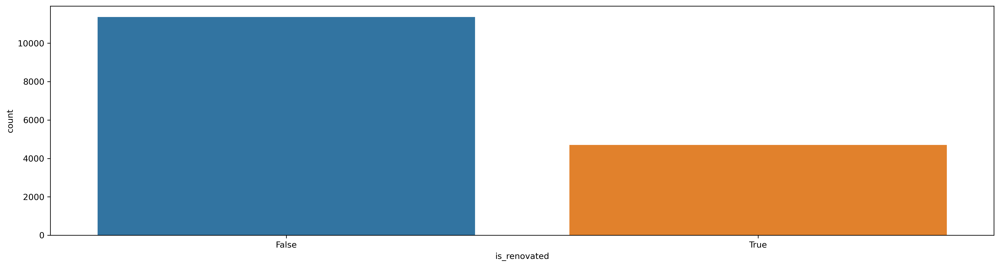

In [88]:
plot_count('is_renovated')

About `5000` instances are renovated (in the last 20 years before sale), about `11000` instances are not.

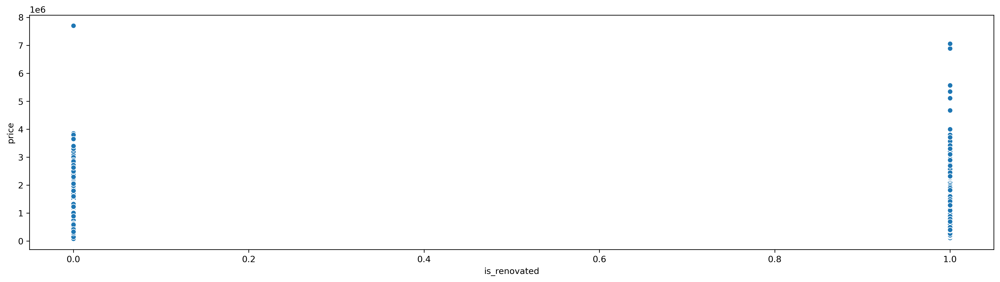

In [89]:
plot_scatter('is_renovated')

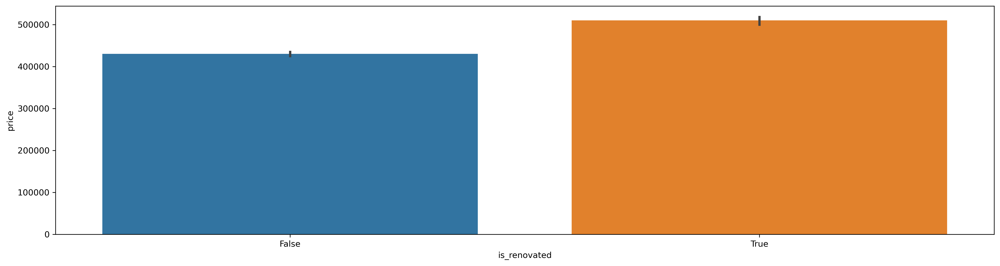

In [90]:
plot_bar_medians(group_by='is_renovated')

The median of the target `'price'` of those renovated instances is with `500000` about `80000` higher than the median of not renovated instances (in the last 20 years before sale).

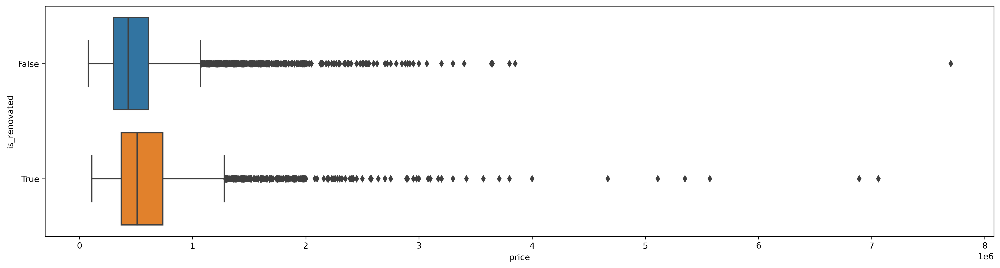

In [91]:
plot_box(group_by='is_renovated')

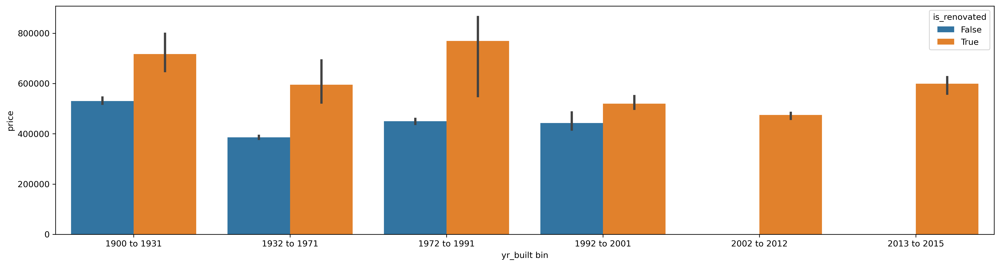

In [92]:
plt.figure(figsize=(20, 5), dpi=300)
sns.barplot(x='yr_built bin', y='price', hue='is_renovated', data=houses_train, estimator=np.median)
plt.show()

### `'lat'`: latitude coordinate of object

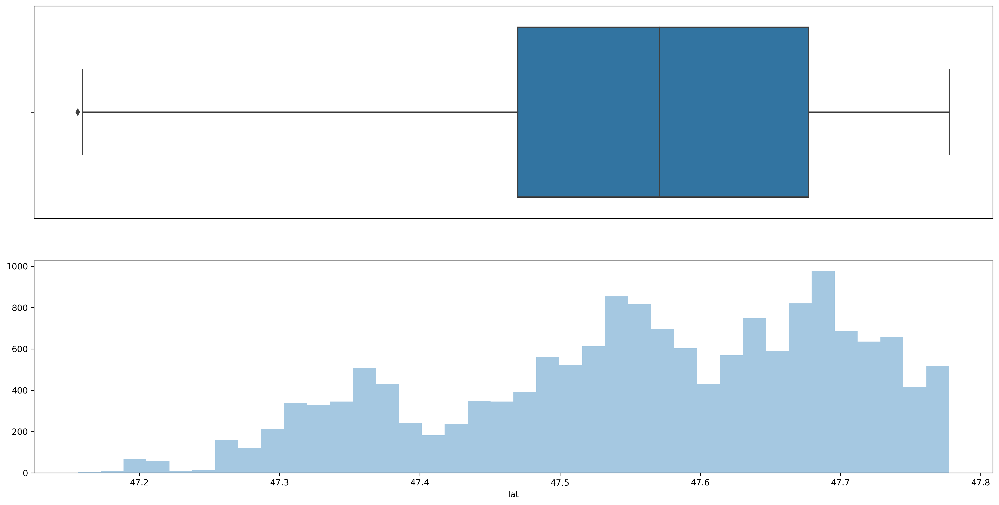

In [93]:
plot_dist('lat')

There is a single, non-extreme outlier with a minimum value of the feature `'lat'`.

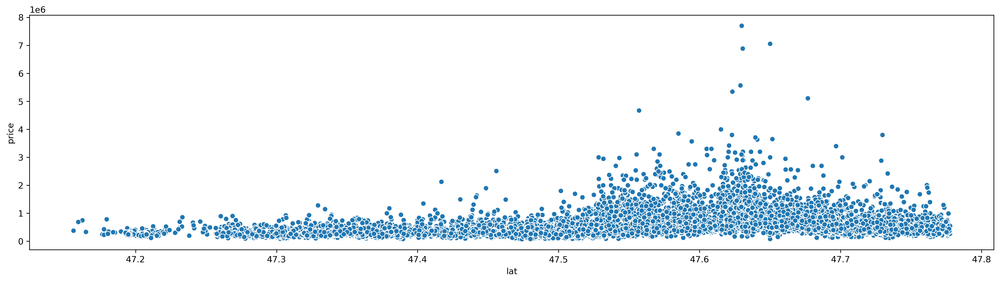

In [94]:
plot_scatter('lat')

The range of values of the target `'price'` is higher if the value of the feature `'lat'` is about `47.6`.

### `'long'`: longitude coordinate of object

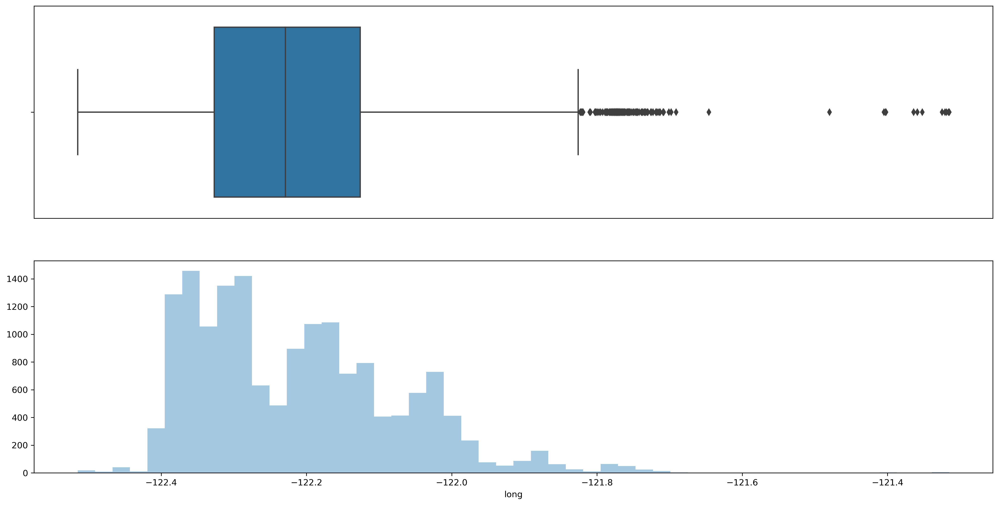

In [95]:
plot_dist('long')

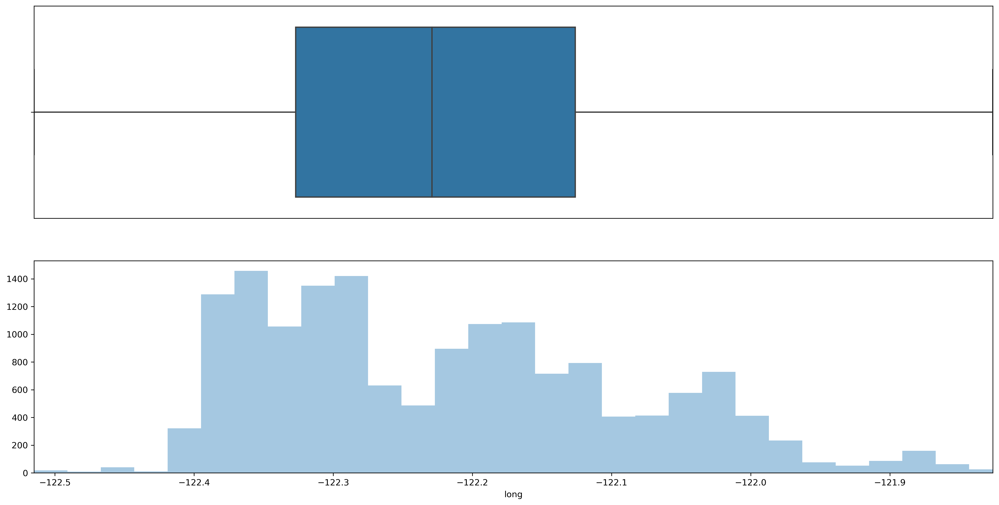

In [96]:
plot_dist('long', restricted=True)

All instances whose value of the feature `'long'` is larger than about `-121.85` are considered outliers (for this feature).

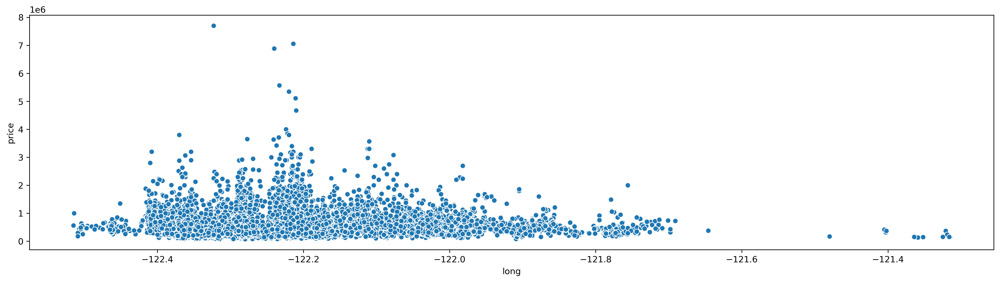

In [97]:
plot_scatter('long')

The range of values of the target `'price'` is higher if the value of the feature `'long'` is about `-122.2`.

### `'zipcode'`: zipcode of area where house is positioned

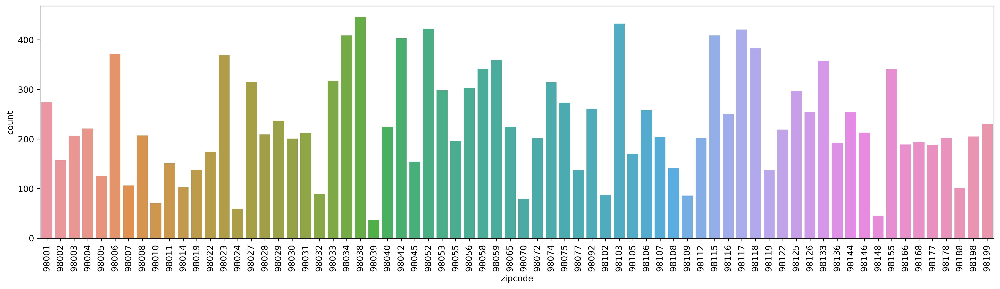

In [98]:
plot_count('zipcode', vertical=True)

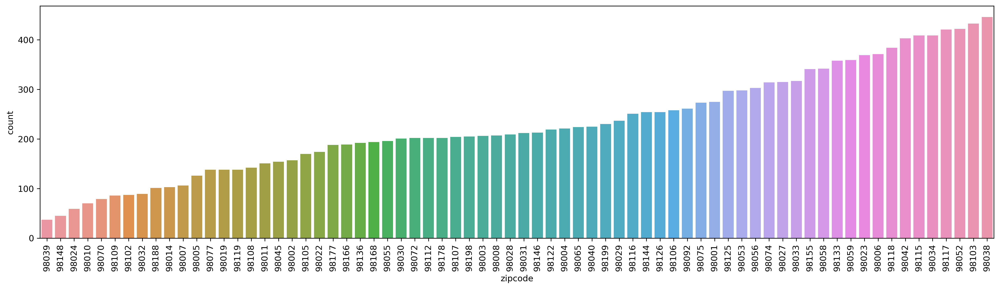

In [99]:
plot_count('zipcode', ordered=True, vertical=True)

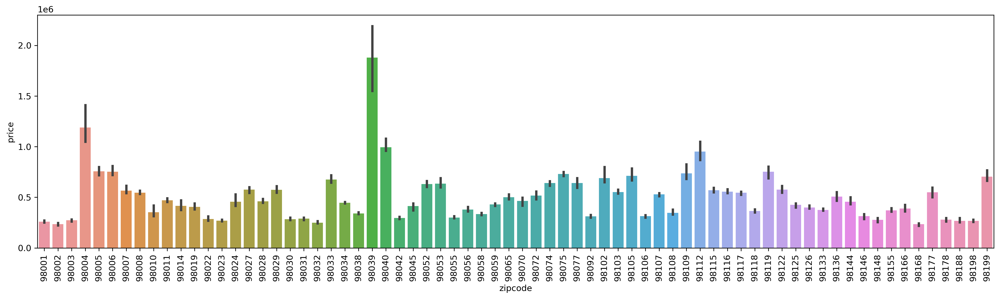

In [100]:
plot_bar_medians(group_by='zipcode', vertical=True)

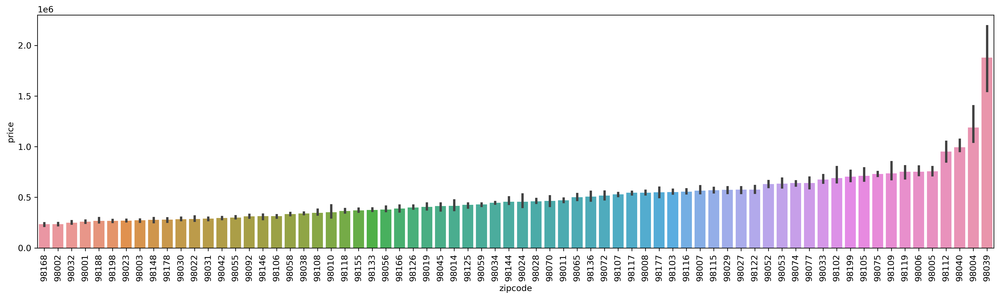

In [101]:
plot_bar_medians(group_by='zipcode', ordered=True, vertical=True)

The objects in the area with zipcode `98039` are the rarest and by far the most expensive.

The predictive power of the feature `'zipcode'` seems to be quite high.

### `'zipcode cat'`: category of zipcode of area

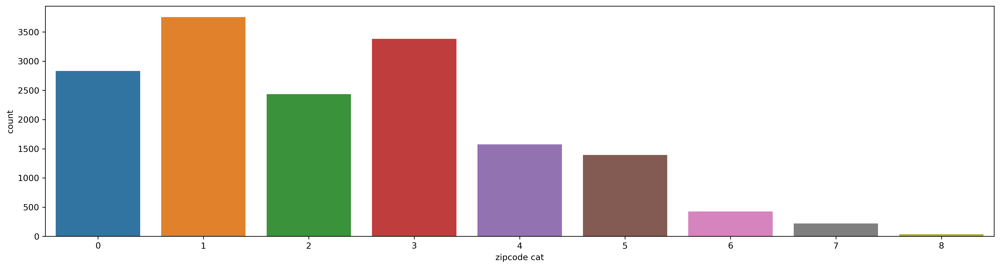

In [102]:
plot_count('zipcode cat')

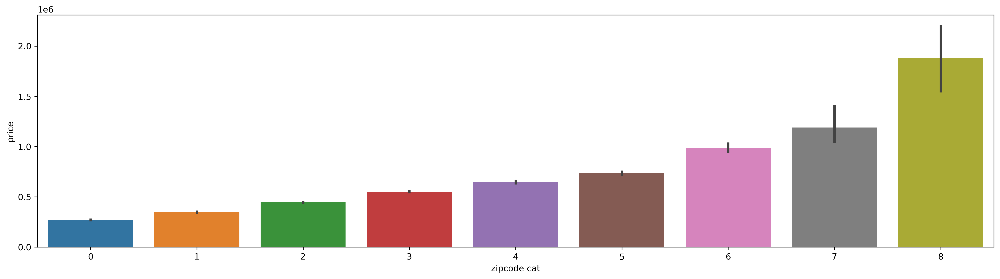

In [103]:
plot_bar_medians(group_by='zipcode cat')

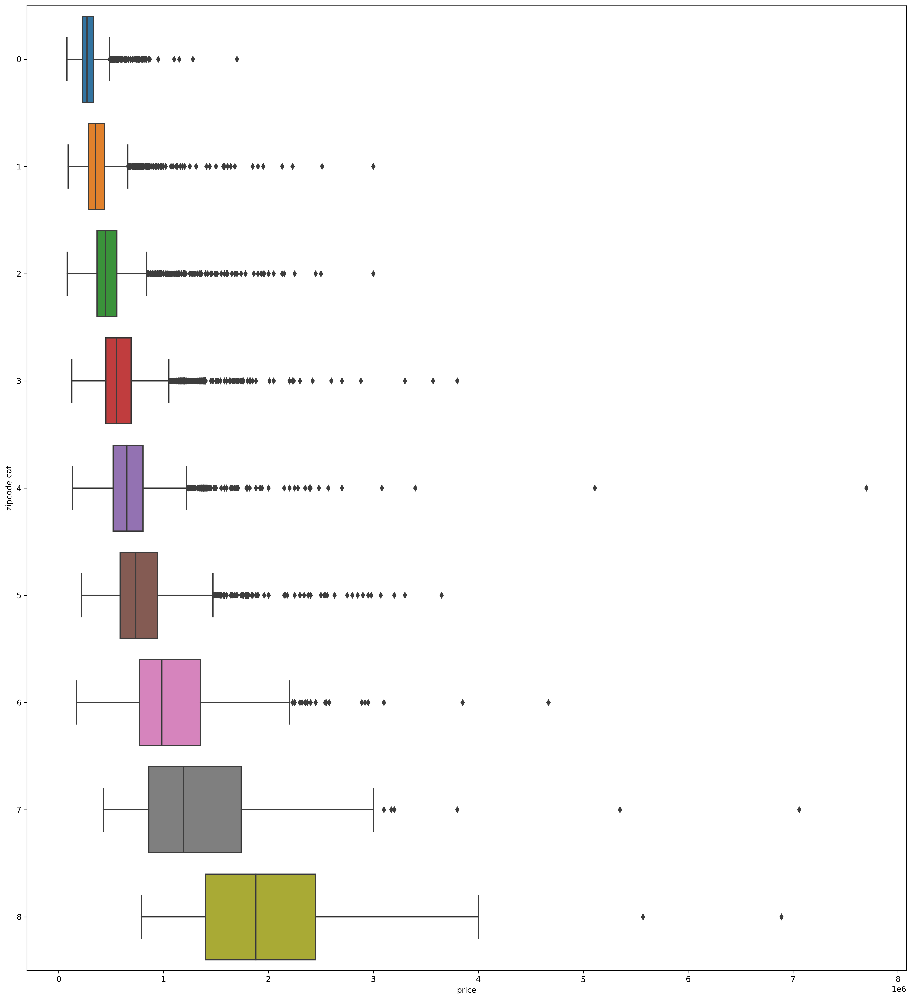

In [104]:
plot_box(group_by='zipcode cat')

The feature `'zipcode cat'` was constructed to be a good indicator for the target `'price'`.

### `'condition'`: overall condition of object

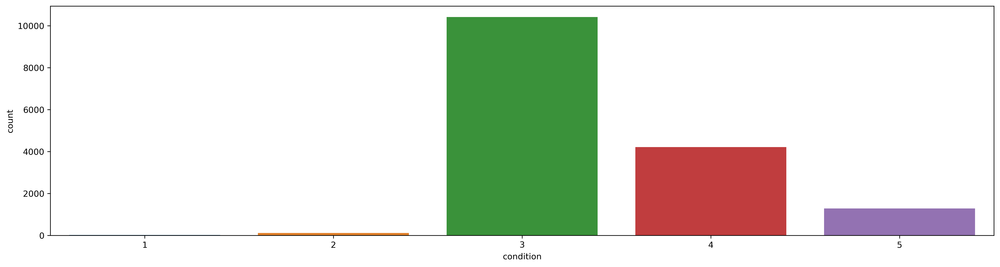

In [105]:
plot_count('condition')

There are very few instances whose value of the feature `'condition'` is below `3`, which is the mode.

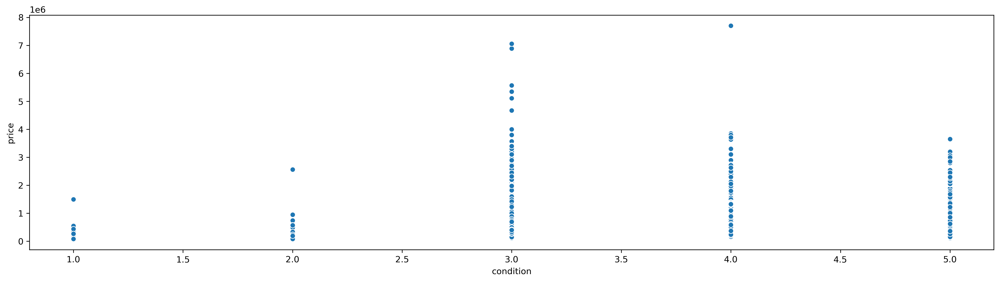

In [106]:
plot_scatter('condition')

The ranges of the value for the target `'price'` grouped by condition with value at least `3` are comparable, although there are a few outliers.

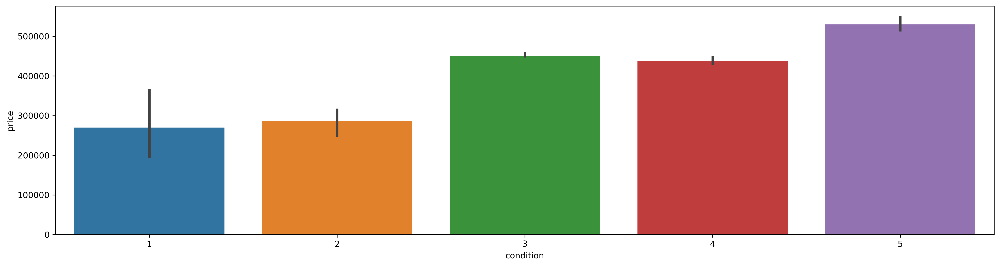

In [107]:
plot_bar_medians(group_by='condition')

With increasing value of the feature `'condition'`, we roughly obtain increasing medians of the target `'price'`.

### `'condition bin'`: category of overall condition

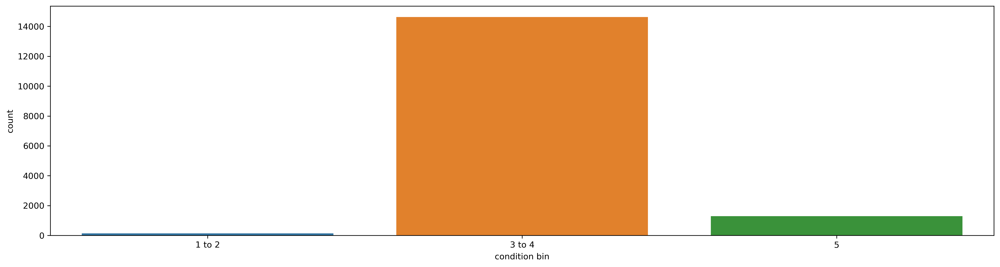

In [108]:
plot_count('condition bin')

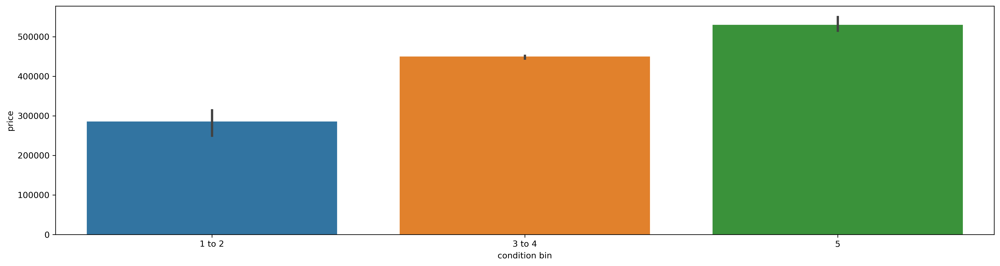

In [109]:
plot_bar_medians(group_by='condition bin')

With increasing value of the feature `'condition bin'`, we obtain increasing medians of the target `'price'`.

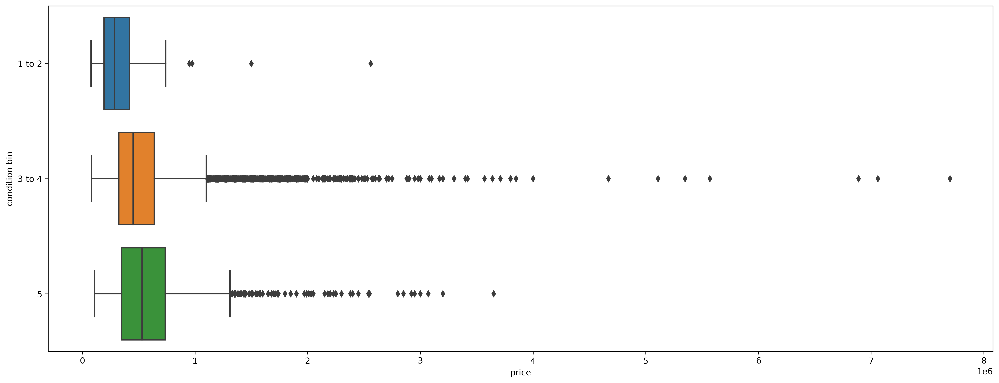

In [110]:
plot_box(group_by='condition bin')

### `'grade'`: overall grade given to the housing unit, based on King County grading system

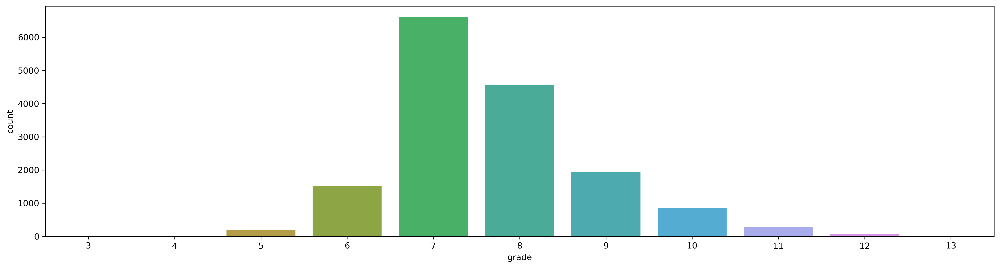

In [111]:
plot_count('grade')

Most instances have a grade between `6` and `10`.

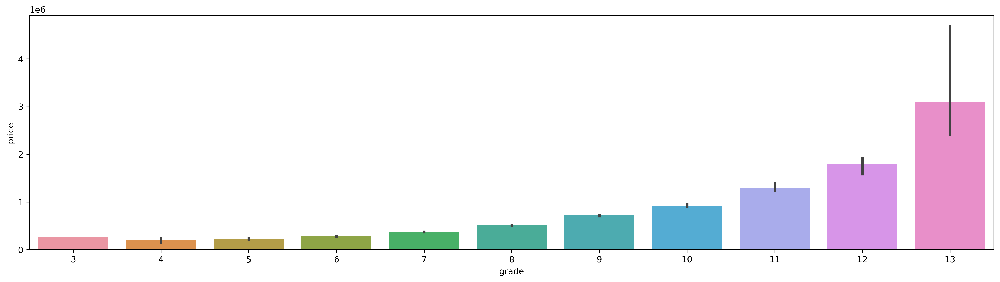

In [112]:
plot_bar_medians(group_by='grade')

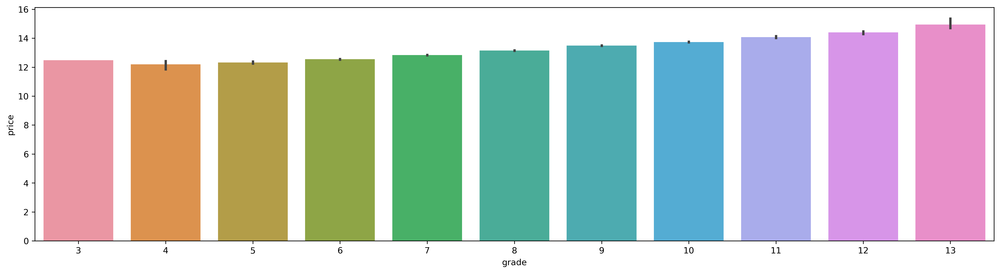

In [113]:
plot_bar_log_medians(group_by='grade')

With increasing value of the feature `'grade'` we obtain exponentially increasing medians of the target `'price'`.

### `'grade bin'`: category of overall grade

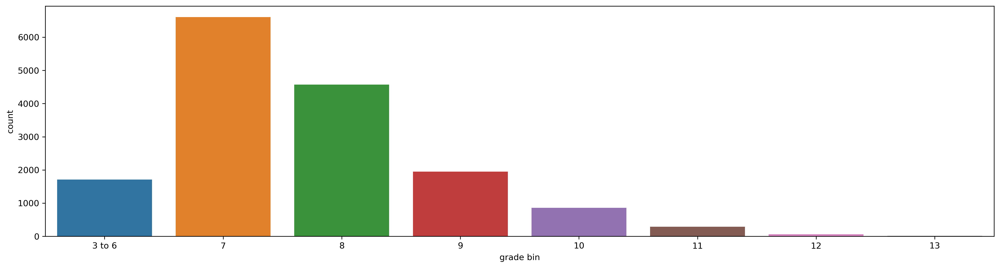

In [114]:
plot_count('grade bin')

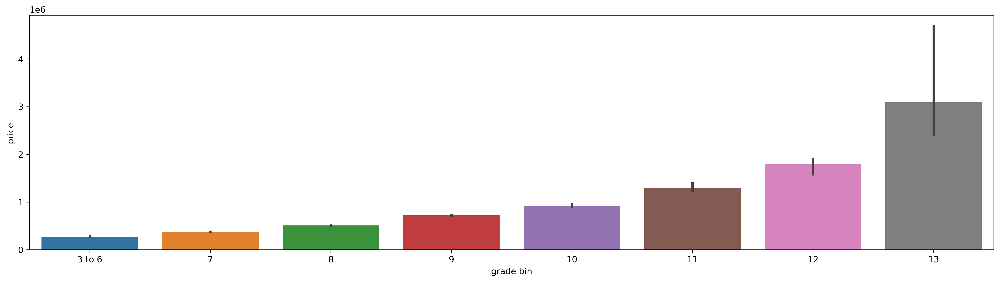

In [115]:
plot_bar_medians(group_by='grade bin')

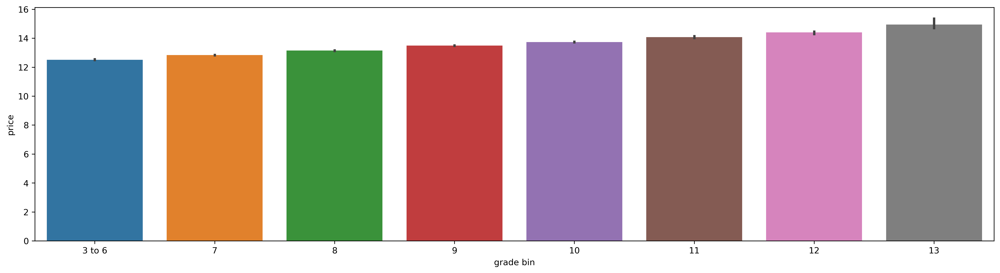

In [116]:
plot_bar_log_medians(group_by='grade bin')

With increasing value of the feature `'grade bin'` we obtain exponentially increasing medians of the target `'price'`.

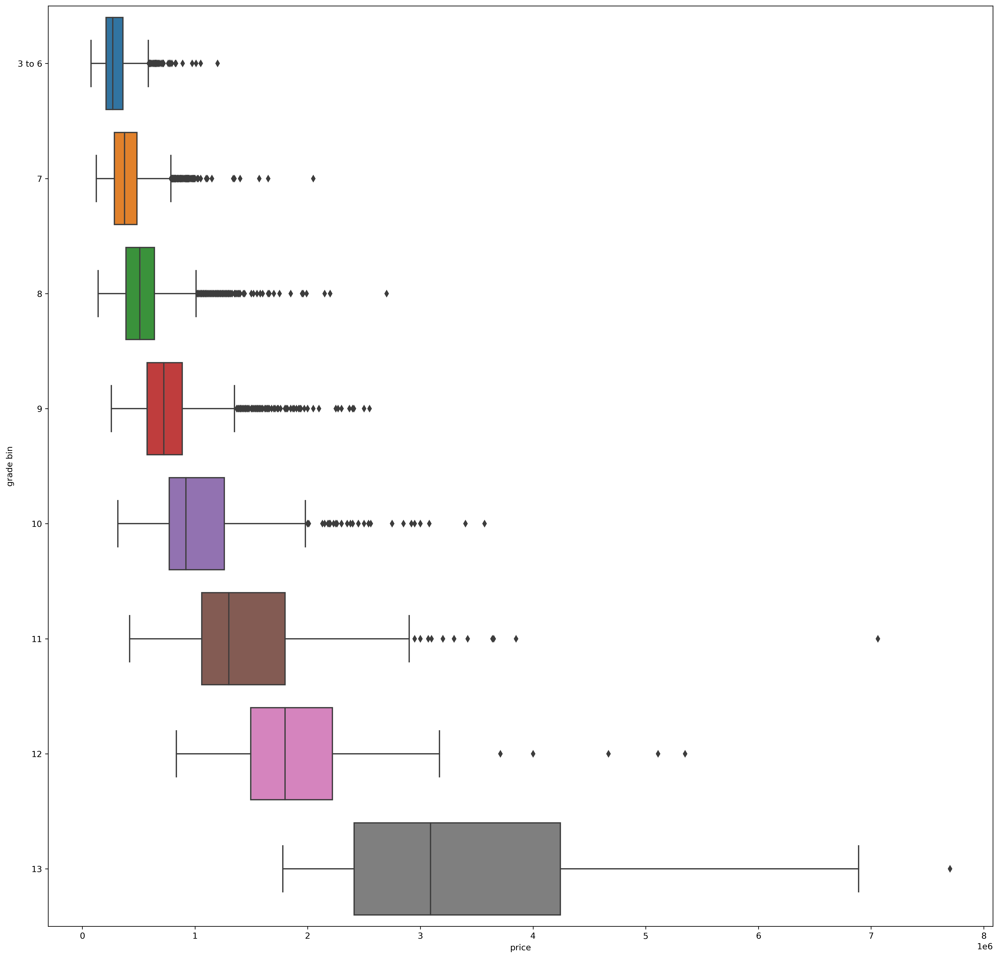

In [117]:
plot_box(group_by='grade bin')

### `'view'`: indicator for views of object

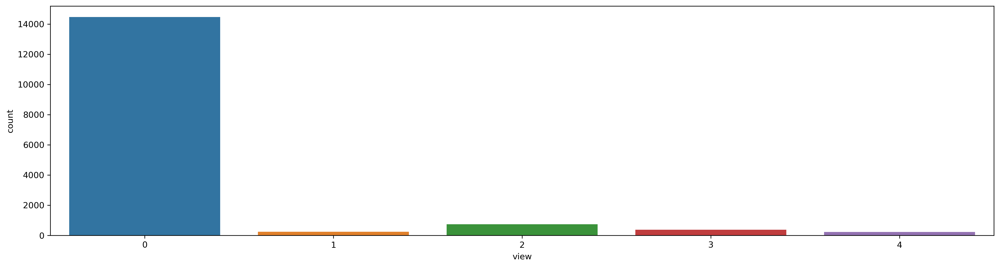

In [118]:
plot_count('view')

By far the most instances have a value of `0` for the feature `'view'`.

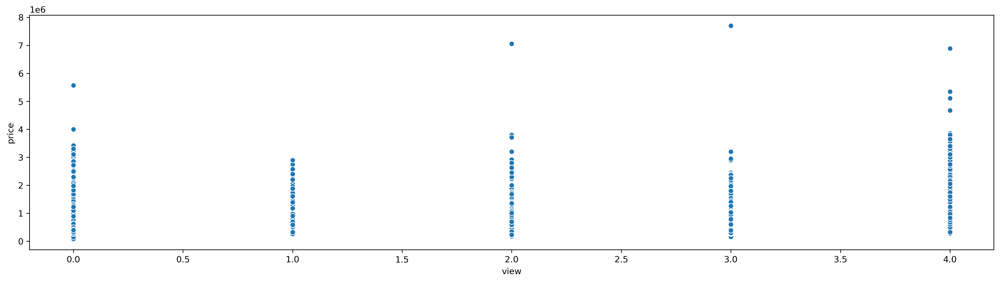

In [119]:
plot_scatter('view')

The price ranges do not seem to depend significantly on the value of the feature `'view'`.

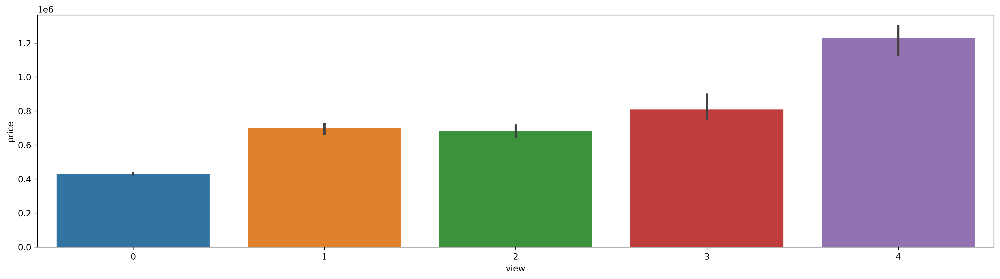

In [120]:
plot_bar_medians(group_by='view')

With increasing value of the feature `'view'` we obtain (roughly) increasing medians of the target `'price'`.

### `'view bin'`: category of overall view

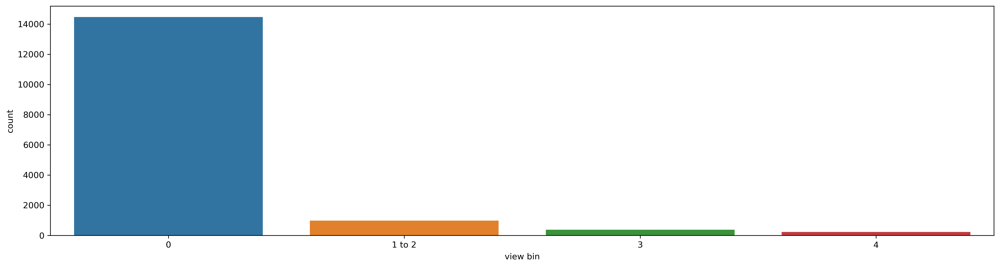

In [121]:
plot_count('view bin')

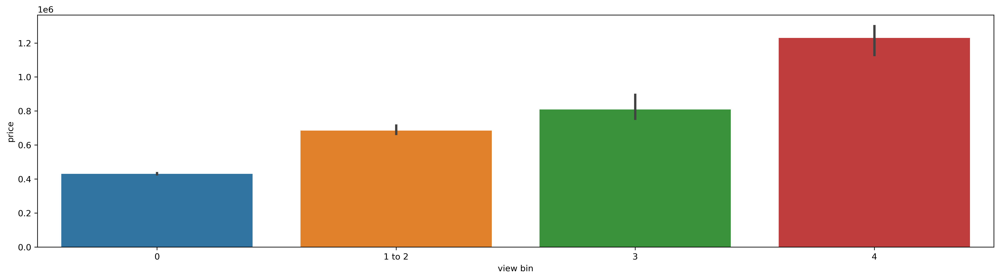

In [122]:
plot_bar_medians(group_by='view bin')

With increasing value of the feature `'view bin'` we obtain (roughly) increasing medians of the target `'price'`.

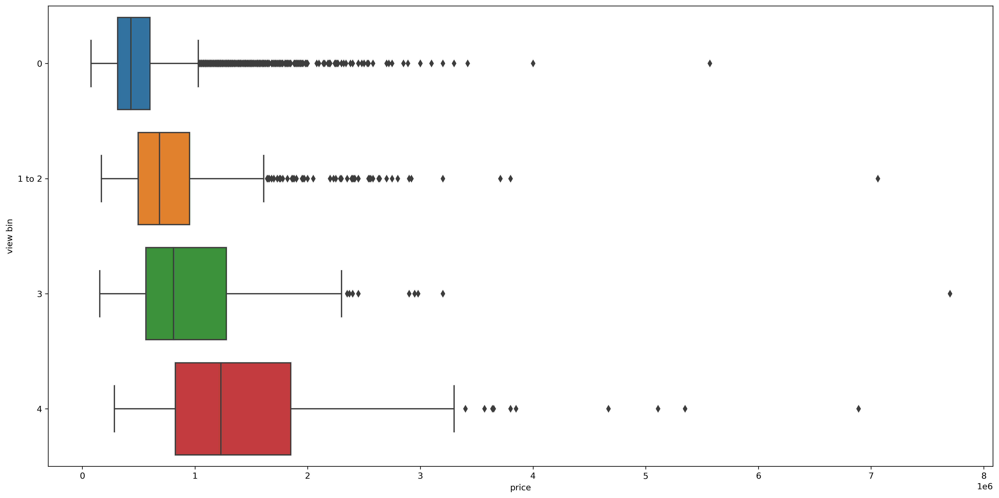

In [123]:
plot_box(group_by='view bin')

### `'waterfront'`: indicator whether house lies at a waterfront

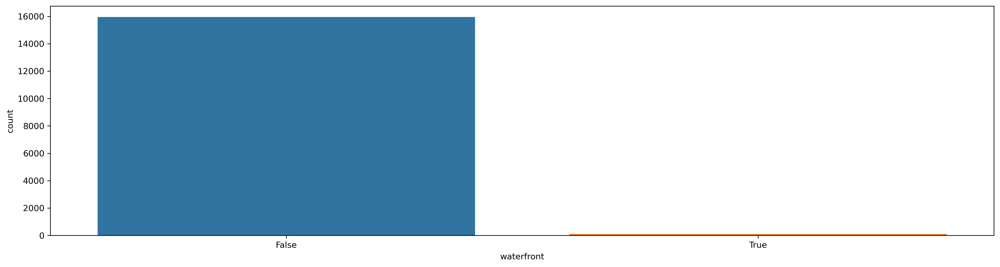

In [124]:
plot_count('waterfront')

There are very few instances whose value `'waterfront'` is `'True'`.

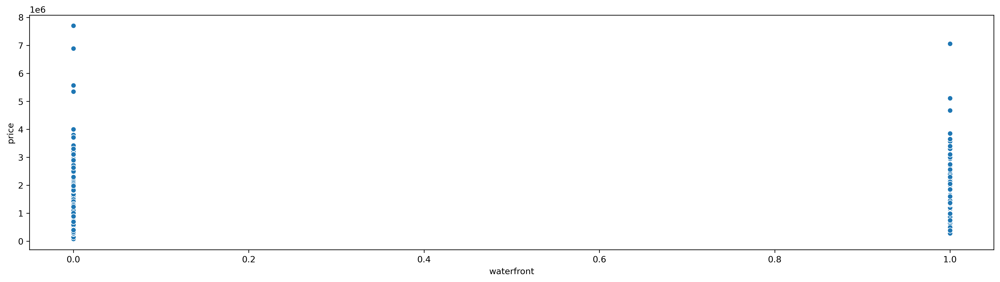

In [125]:
plot_scatter('waterfront')

The ranges of sale prices do not depend on the value of the feature `'waterfront'`.

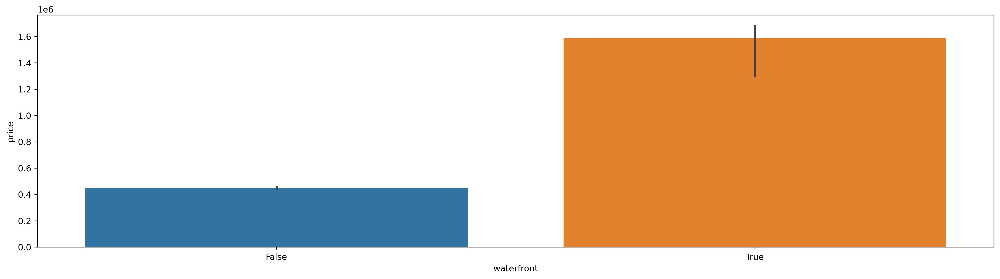

In [126]:
plot_bar_medians(group_by='waterfront')

However, the median of the target `'price'` of those instances lying at a waterfront is with over `1600000` about `1100000` higher than the median of those instances not lying a waterfront.

## Correlation analysis

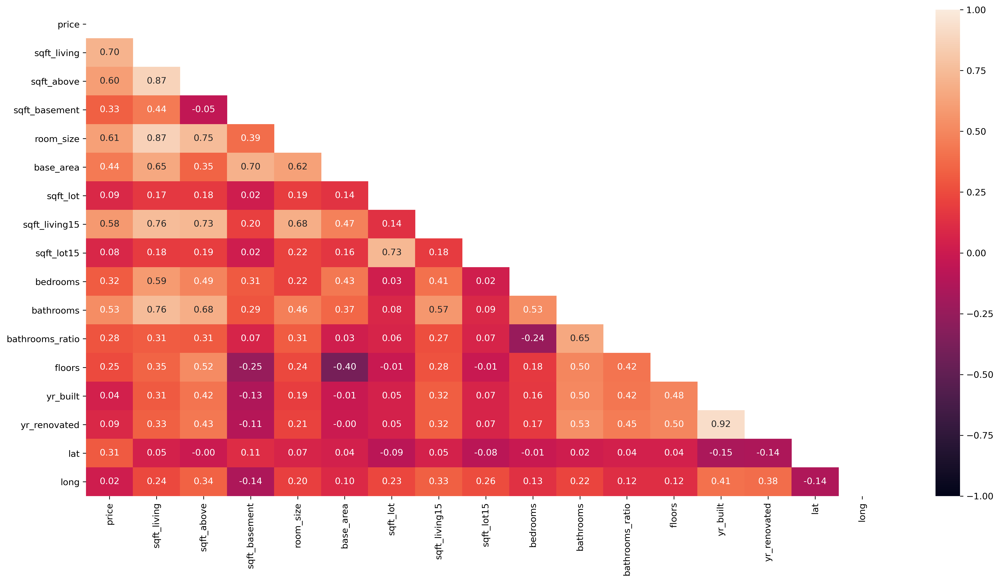

In [127]:
correlations = houses_train.select_dtypes(['int64', 'float64']).corr()
mask = np.triu(np.ones(correlations.shape))

plt.figure(figsize=(20, 10), dpi=300)
sns.heatmap(correlations, vmin=-1.0, vmax=1.0, annot=True, fmt='.2f', mask=mask)
plt.show()

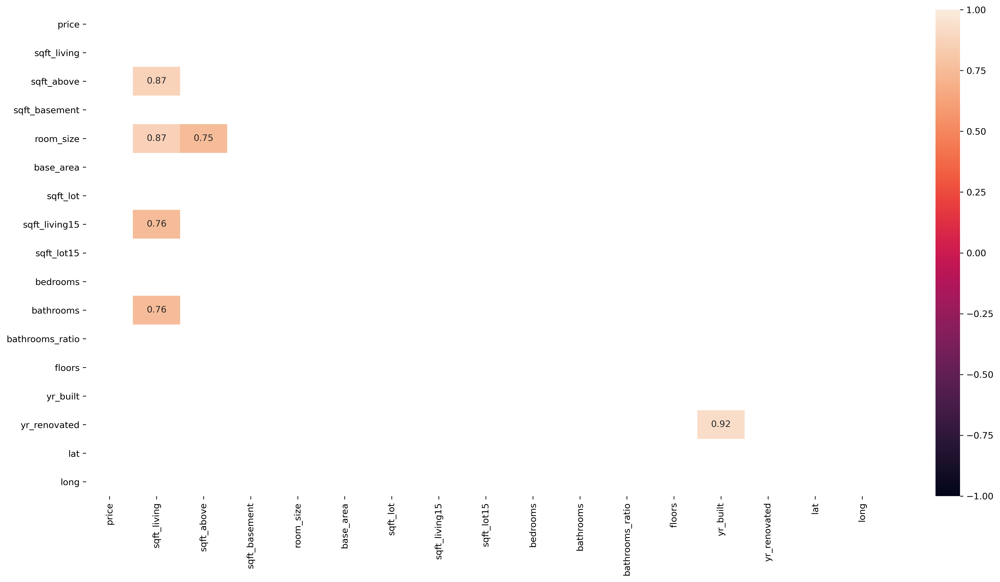

In [128]:
threshold = 0.75
mask = ((correlations > -threshold) & (correlations < threshold)) | np.triu(np.ones(correlations.shape))

plt.figure(figsize=(20, 10), dpi=300)
sns.heatmap(correlations, vmin=-1.0, vmax=1.0, annot=True, fmt='.2f', mask=mask)
plt.show()

In [129]:
correlations.stack()[((correlations.stack() >= threshold) | (correlations.stack() <= -threshold))
                     & (correlations.stack() != 1.)]

sqft_living    sqft_above      0.87
               room_size       0.87
               sqft_living15   0.76
               bathrooms       0.76
sqft_above     sqft_living     0.87
               room_size       0.75
room_size      sqft_living     0.87
               sqft_above      0.75
sqft_living15  sqft_living     0.76
bathrooms      sqft_living     0.76
yr_built       yr_renovated    0.92
yr_renovated   yr_built        0.92
dtype: float64